<a href="https://colab.research.google.com/github/lblabucsd/Zada_Schulze_24/blob/main/dc_neural_analysis_iso_schooling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

#load packages
!pip install pynrrd
!pip install scikit-posthocs

import os
import csv
import numpy as np
import pandas as pd
import math
import time
import json
import matplotlib as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
import nrrd
import scipy
from scipy import io
from scipy.fftpack import rfft, irfft, fftfreq
import scipy.stats as stats
import statsmodels
import seaborn as sns
from sklearn.decomposition import PCA, FastICA
from sklearn.cluster import KMeans, AgglomerativeClustering
import random
from random import randrange
from random import shuffle
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score
import itertools
import scikit_posthocs as sp
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.multitest as multi
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import warnings
warnings.simplefilter('ignore')
%matplotlib inline
sns.set_style("white")


def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def running_mean(x, N):
    return np.convolve(x, np.ones((N,))/N)[(N-1):]

def norm(inputs):
    output = (inputs-min(inputs))/(max(inputs)-min(inputs))
    return output

def baseline_subtraction(angle, window):
    new=[]
    for ndx,i in enumerate(angle):
        if ndx<window/2 or ndx>len(angle)-window/2:
            new.append(0)
        else:
            baseline=np.median(angle[ndx-int(window/2):ndx+int(window/2)])
            new.append(i-baseline)
    return new

def resized(data,N):
    old_indices = np.linspace(0, len(data) - 1, len(data))
    new_indices = np.linspace(0, len(data) - 1, N)
    res = np.interp(new_indices, old_indices, data)
    return res

import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

sns.set(font_scale=3)
sns.set_style("white")

figure_savepath = '/content/drive/MyDrive/Zada_Schulze_paper/Figures_output/Neural_activity/Isolated/'

print("S1 = horizontal object stimulus")
print("S2 = vertical object stimulus")
print("S3 = circle object stimulus")
print("S4 = floor drift stimulus")

Mounted at /content/drive/
S1 = horizontal object stimulus
S2 = vertical object stimulus
S3 = circle object stimulus
S4 = floor drift stimulus


In [ ]:
#linear model function

from sklearn.datasets import make_classification
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression, LinearRegression, LassoCV, RidgeCV, ElasticNet, ElasticNetCV
from sklearn import metrics
from sklearn.model_selection import train_test_split, LeaveOneOut
from sklearn.metrics import mutual_info_score, explained_variance_score
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.utils import shuffle as skshuff
from copy import deepcopy


def linear_model(regressors, neurons):

    weight_set = [[] for r in regressors] #beta weights and UEVs for regressors
    pred_scores=[]

    arg_set = regressors
    x=np.array(arg_set).T #arrays as inputs

    for idx,i in enumerate(neurons):

        y=np.array(i) #predicting cell_fluoresence

        Xtrain, Xtest, ytrain, ytest = train_test_split(x, y, test_size=0.1, random_state=5)

        regr = RidgeCV(cv=10, alphas=(0.001, 0.01, 0.1, 1.0, 10.0), gcv_mode='svd')

        regr.fit(Xtrain, ytrain)
        pred_arr = regr.predict(Xtest)
        score = regr.score(Xtest,ytest)
        ccf = regr.coef_.tolist()
        pred_scores.append(score)


        for cf,ls in zip(ccf,weight_set):
            ls.append([cf,0]) #both beta wight (cf) and unique explained variance (exp)

        if idx % 250==0:
          print("on cell # ",idx, " of ", len(neurons), 'pred score', score)
          print(ccf)
          #print(tmp)

    return pred_scores, weight_set, regressors


In [ ]:
#simple response magnitude, selectivity index, and correlation coefficients

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]


subjects = wk6_subjects+iso6_subjects


resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use


for f in subjects:
      print(f)
      path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

      #load processed imaging data
      load = np.load(path+'neuron_details_with-anatomy.npz', allow_pickle=True)
      coords = load['neuron_coordinates']
      xs=[i[0] for i in coords]
      ys=[i[1] for i in coords]
      tr=load['neuron_traces']
      neuron_locations = load['neuron_anatomy']

      load=np.load(path+'movement_stats.npz', allow_pickle=True)
      tmp=load['time_sec']
      time=[i-tmp[0] for i in tmp]
      new_time_base = int(max(time)*resample_Hz)
      tail_angle=resized(load['angle'],new_time_base)
      turn_array=resized(load['any_turn_array'],new_time_base)
      stimulus=load['stim']

      s0=np.zeros(len(stimulus));
      s1=np.zeros(len(stimulus));
      s2=np.zeros(len(stimulus));
      s3=np.zeros(len(stimulus));
      s4=np.zeros(len(stimulus));

      for ndx,i in enumerate(stimulus):
          if i==0:
            s0[ndx]=1
          if i==1:
            s1[ndx]=1
          if i==2:
            s2[ndx]=1
          if i==3:
            s3[ndx]=1
          if i==4:
            s4[ndx]=1

      #resample all to common Hz, and crop to first X% of behavior
      S1=resized(s1,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
      S2=resized(s2,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
      S3=resized(s3,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
      S4=resized(s4,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
      MOV=resized(turn_array,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]

      #get stimulus onset times
      post_stim_dur=12*resample_Hz   #post-stimulus duration (s)

      S1_ON = [ndx for ndx,i in enumerate(S1) if i>0 and S1[ndx-1]==0 and resample_Hz < ndx < len(S1)-post_stim_dur]
      S2_ON = [ndx for ndx,i in enumerate(S2) if i>0 and S2[ndx-1]==0 and resample_Hz < ndx < len(S2)-post_stim_dur]
      S3_ON = [ndx for ndx,i in enumerate(S3) if i>0 and S3[ndx-1]==0 and resample_Hz < ndx < len(S3)-post_stim_dur]
      S4_ON = [ndx for ndx,i in enumerate(S4) if i>0 and S4[ndx-1]==0 and resample_Hz < ndx < len(S4)-post_stim_dur]
      MOV_ON = [ndx for ndx,i in enumerate(MOV) if i>0 and MOV[ndx-1]==0 and resample_Hz < ndx < len(MOV)-post_stim_dur]

      #convolve regressors
      decay = 3.0*resample_Hz #(calcium decay - 3s x volume Hz sampling)
      tmp = pd.DataFrame(data=S1)
      s1_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
      tmp = pd.DataFrame(data=S2)
      s2_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
      tmp = pd.DataFrame(data=S3)
      s3_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
      tmp = pd.DataFrame(data=S4)
      s4_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
      tmp = pd.DataFrame(data=MOV)
      mov_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]

      regressors = [s1_conv,s2_conv,s3_conv,s4_conv,mov_conv]
      onsets = [S1_ON,S2_ON,S3_ON,S4_ON,MOV_ON]

      neuron_traces__=[]
      raw_traces=[]
      for i in tr:
          tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
          kernel_size = int(1.0*resample_Hz) #1s
          kernel = np.ones(kernel_size) / kernel_size
          tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
          tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
          tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
          neuron_traces__.append(scipy.stats.zscore(tmp2))
          raw_traces.append(tmp2) #append zscore

      output_ops =np.load(path+"suite2p/plane0/ops.npy", allow_pickle=True).item()

      decay = 3.0*resample_Hz #(calcium decay - 3s x volume Hz sampling)
      tmp = pd.DataFrame(data=S1)
      s1_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]

      corr_coeffs = [] #pearsons r
      responses = [] #mean post-stimulus response
      psths = [] #peri-stimulus timeseries
      selectivity = [] #[object, drift]
      for regressor,onset in zip(regressors, onsets):
        tmp=[]; tmp2=[]; tmp3=[];
        for tr,rtr in zip(neuron_traces__, raw_traces):
          r,p = scipy.stats.pearsonr(tr,regressor)
          tmp.append(r)
          tmp2.append(np.mean([np.max(tr[i:i+post_stim_dur]) for i in onset if i<(len(tr)-post_stim_dur)]))
          tmp3.append([tr[i-resample_Hz:i+post_stim_dur] for i in onset if i<(len(tr)-post_stim_dur)])
        corr_coeffs.append(tmp)
        responses.append(tmp2)
        psths.append(tmp3)
      for tr in neuron_traces__:
        obj_selectivity_index = abs(np.mean([np.max(tr[i:i+post_stim_dur]) for i in onsets[0]]) - np.mean([np.max(tr[i:i+post_stim_dur]) for i in onsets[1]]))
        drf_selectivity_index = abs(np.mean([np.max(tr[i:i+post_stim_dur]) for i in onsets[0]]) - np.mean([np.max(tr[i:i+post_stim_dur]) for i in onsets[3]]))
        selectivity.append([obj_selectivity_index,drf_selectivity_index])

      np.savez(path+'PSTHs.npz', responses = responses, selectivity = selectivity)#, psths = psths)


DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling


DZ-230529_wk6_f1_-130_schooling


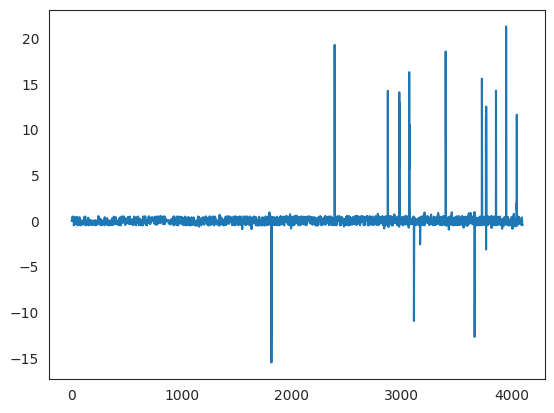

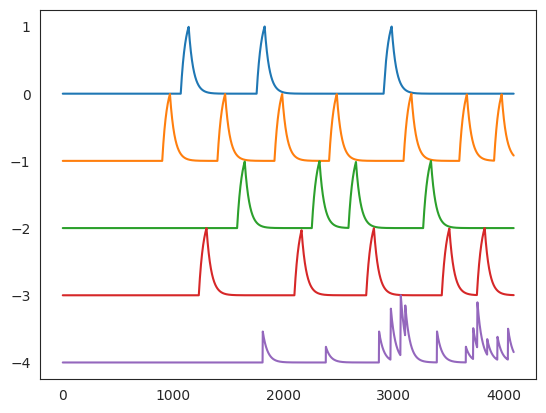

on cell #  0  of  1327 pred score 0.17172135646443187
[1.408876677391597, 0.9323832807503473, -0.008536661260349094, 0.47498232838667476, 22.50346862229418]
on cell #  250  of  1327 pred score 0.1497864832229472
[0.9516035341311073, 1.5895789299631635, 0.7216588221093928, 0.7442198780137352, 13.41397300511285]
on cell #  500  of  1327 pred score -0.0033174778293492135
[0.5396544246045862, 0.6823618651640063, 0.755305006163329, 0.47329408072454027, -6.590308841200919]
on cell #  750  of  1327 pred score 0.1274007942936084
[0.006638436825080091, 0.6839170739015438, 0.8392719670767708, 1.168836634022562, 20.03819341206399]
on cell #  1000  of  1327 pred score 0.07368357076326049
[1.1318419947042857, 0.6467989241016192, 0.43119630106172385, 1.5114999180411146, 10.258435667525381]
on cell #  1250  of  1327 pred score 0.06720687991191565
[0.3478171816805107, -0.20471644010216528, -0.023282425943752762, -0.16091935984520123, -18.4405421257707]
pred (1327,) 1327
pred (5, 1327, 2) 5


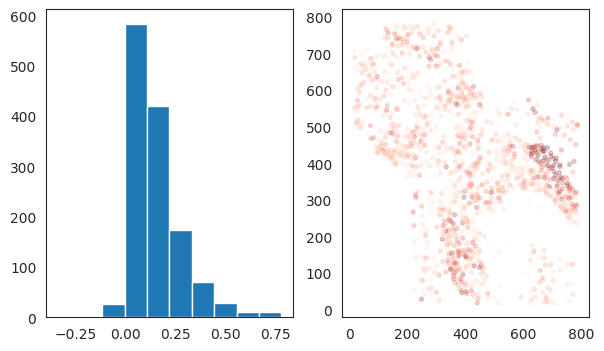

beta weights


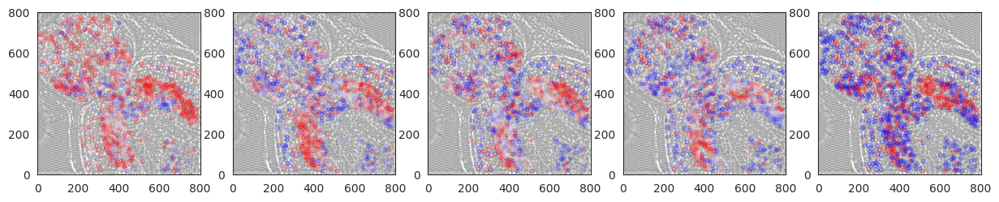

UEVs 


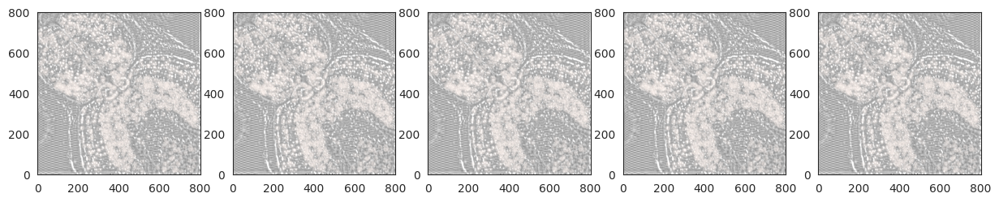

DZ-230529_wk6_f2_-110_schooling


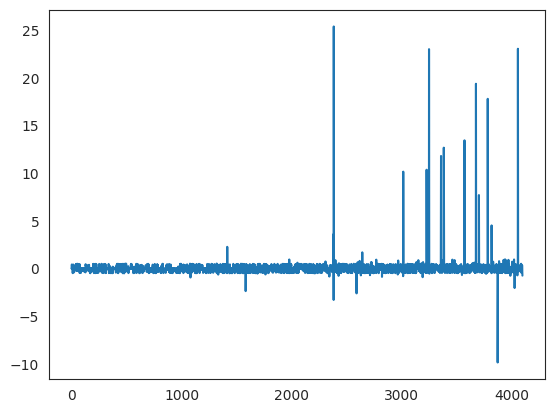

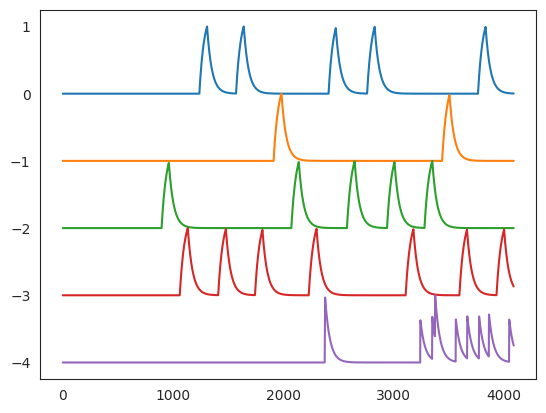

on cell #  0  of  653 pred score 0.13744004856758318
[1.5620755303114289, 0.16688200658120717, -0.6543858003470329, 0.844415417026674, -14.09399855032651]
on cell #  250  of  653 pred score 0.011808389158338706
[0.8071322824880229, 0.5883833318835888, 0.012313430357659633, 0.3783991394504263, -6.22688339585853]
on cell #  500  of  653 pred score 0.03713005331504393
[0.04237668199469183, 0.5954631590259732, 0.7730455837630333, 0.5618356176096228, 9.486311257282376]
pred (653,) 653
pred (5, 653, 2) 5


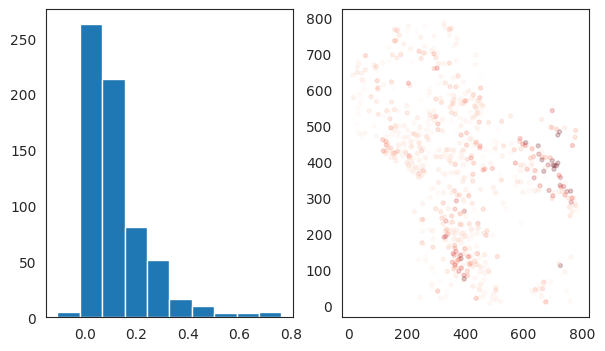

beta weights


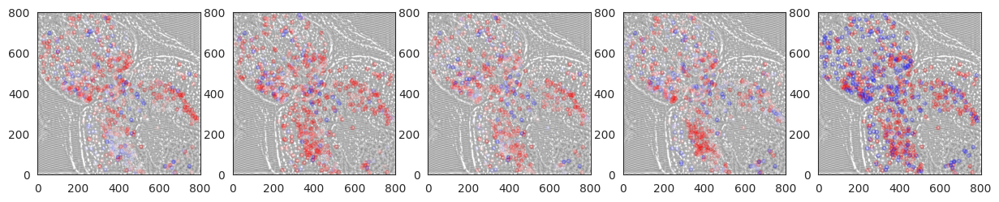

UEVs 


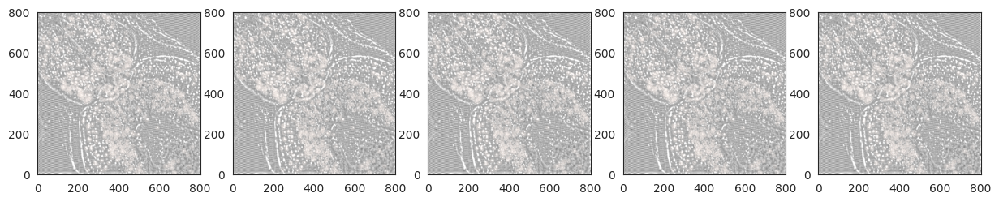

DZ-230524_wk6_f1-2_schooling


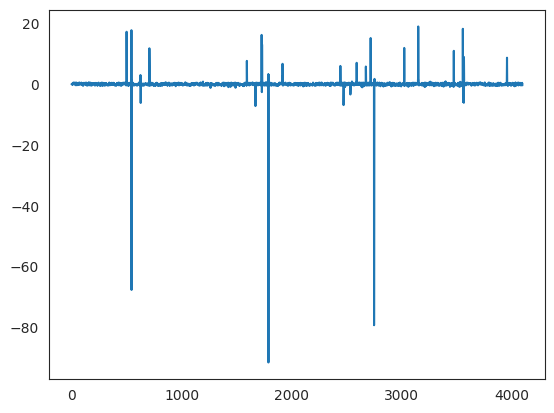

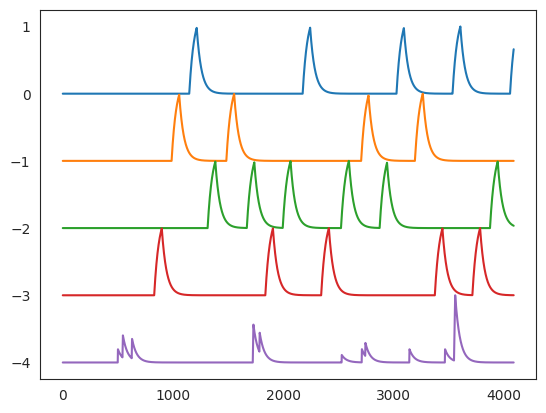

on cell #  0  of  831 pred score 0.3396267176993064
[-0.7161064995993563, -1.098306002696922, -0.5870941383516752, 0.9646897776119635, 22.53603036159815]
on cell #  250  of  831 pred score 0.10640845798760856
[0.9937954847665761, 0.40785129169715184, 1.4155959999858914, -0.47173843114786895, -1.5426686652469361]
on cell #  500  of  831 pred score 0.004547134445073375
[-0.537775280291491, 0.06433429554891802, 0.2508839757717625, -0.46406280355649715, 3.6382245814203262]
on cell #  750  of  831 pred score 0.31821135738150397
[-0.5740201414882343, -0.7488391574919465, -0.534910213389816, -0.6646997316095178, 22.90295502078873]
pred (831,) 831
pred (5, 831, 2) 5


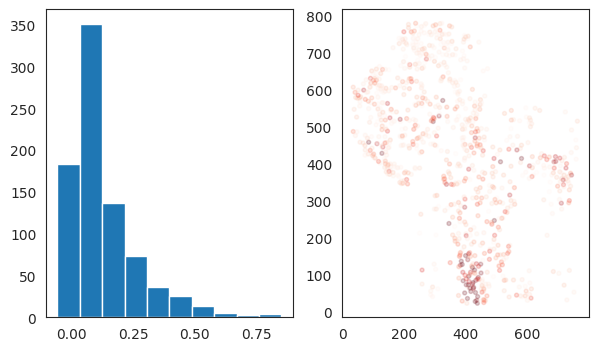

beta weights


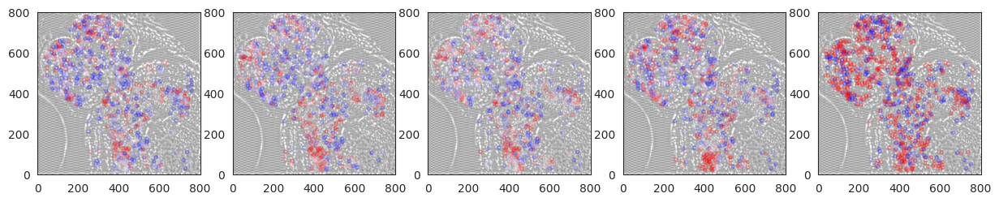

UEVs 


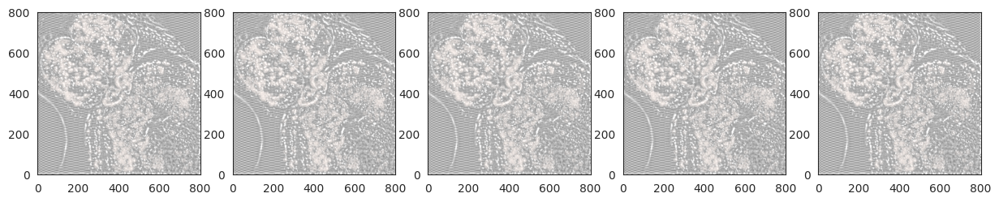

DZ-230522_wk6_f2-2_schooling


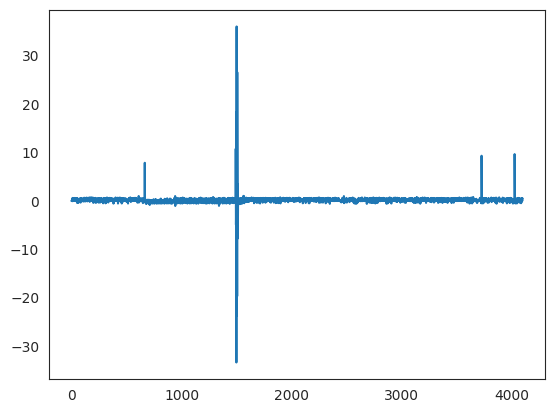

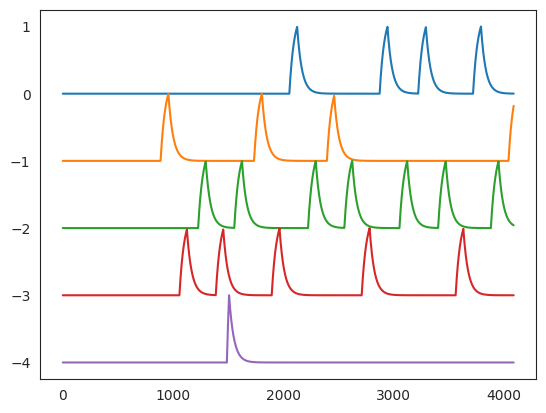

on cell #  0  of  1299 pred score 0.13703151905571087
[1.355664755241719, 1.7760647218372199, 0.9183321070471803, 1.6118860964214379, -3.8490262615661606]
on cell #  250  of  1299 pred score 0.12048514306095359
[-0.221667690748734, 1.4569532480887168, 0.40969071662357764, 0.40778960521488156, 6.285606013948951]
on cell #  500  of  1299 pred score 0.05866705806828565
[0.6116666565863106, -0.85234643156284, -0.16377040234181647, -0.7245860037215602, -4.3731376343456]
on cell #  750  of  1299 pred score 0.34223950389704905
[3.007689775510765, 1.1279377600201101, 0.8550970408449967, -0.3929278932733571, 4.506268882948443]
on cell #  1000  of  1299 pred score 0.3153447455075621
[-1.113049502892707, -0.411604705431141, -0.24926110403111823, -0.07867310415936658, 11.74176926426313]
on cell #  1250  of  1299 pred score 0.29254848966738056
[3.0299723740276914, 0.8066625330914309, 1.2634792441895522, -0.013029785607350375, 8.569355685629333]
pred (1299,) 1299
pred (5, 1299, 2) 5


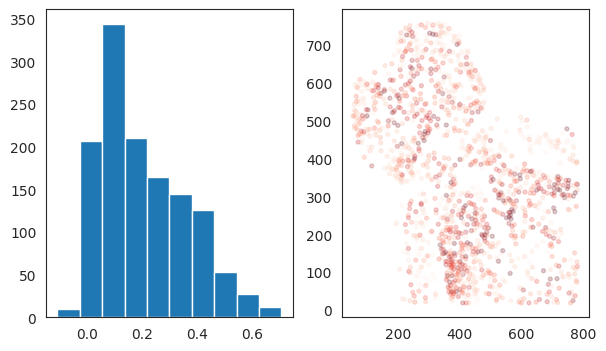

beta weights


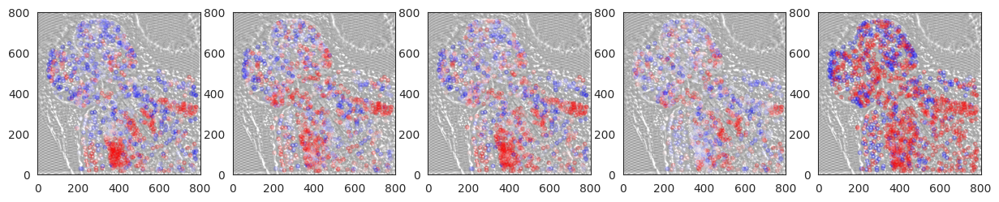

UEVs 


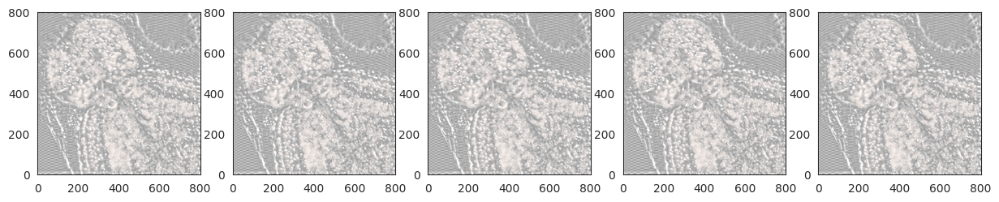

DZ-230521_wk6_f2_schooling


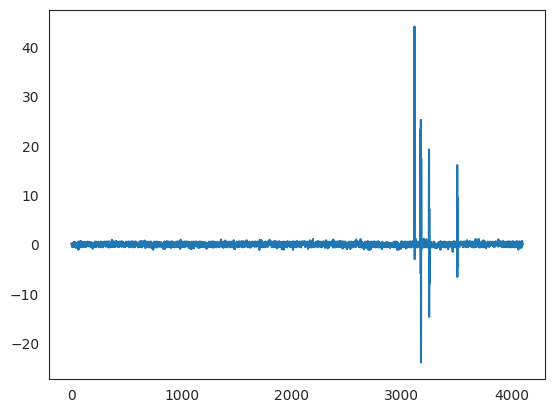

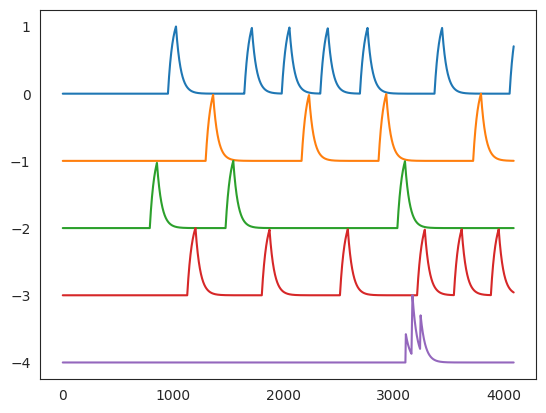

on cell #  0  of  568 pred score 0.6101213485778814
[0.07775333718842581, -0.06709056475418908, -0.12886678829190223, 0.4018331344698799, 34.17644937833936]
on cell #  250  of  568 pred score 0.3871490437480444
[2.5345732856063448, 1.8088661270529267, 1.8483018369690813, 0.11423906485217873, -9.117310934906039]
on cell #  500  of  568 pred score 0.20385089096667852
[-0.027934138526636978, -0.2857474172474555, 2.4375778289489793, 0.14283715363544844, 0.20694994748129245]
pred (568,) 568
pred (5, 568, 2) 5


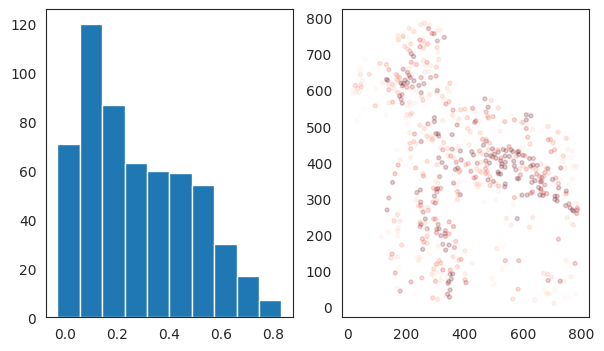

beta weights


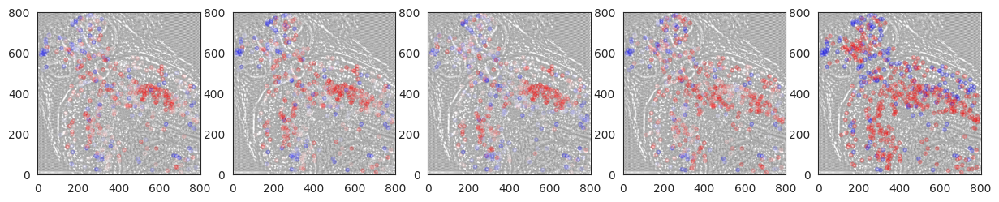

UEVs 


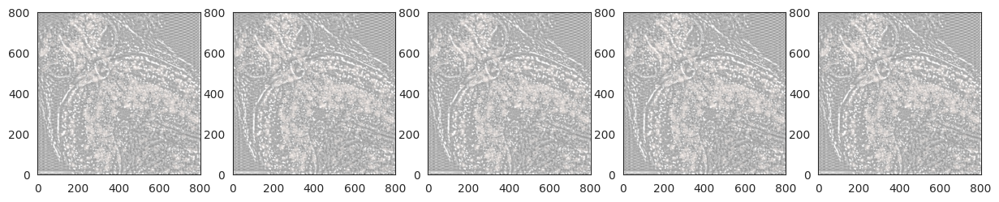

DZ-231025_f1-90_iso6_schooling


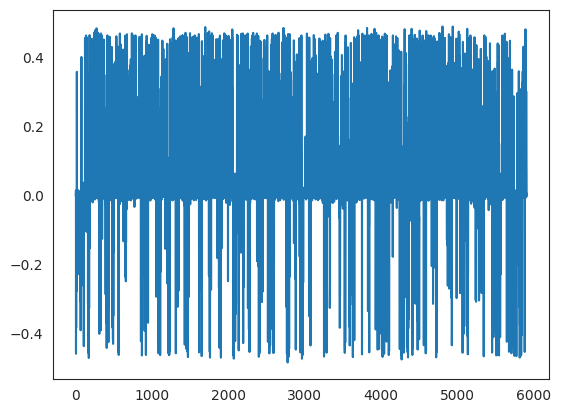

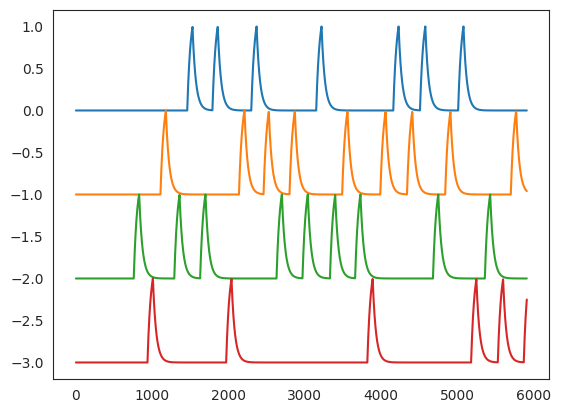

on cell #  0  of  2883 pred score 0.41539806315285766
[1.6573951728276706, 1.905404534550468, 2.6530132490290006, 0.14408602113514962, 0.0]
on cell #  250  of  2883 pred score 0.01901317835756311
[0.3383645934095621, 0.2489235116827408, 0.4106590370613838, 0.06295796049706545, 0.0]
on cell #  500  of  2883 pred score 0.06669323086166201
[0.3903011496455059, 1.0003098833452704, 0.4552992422568099, 0.08432963507587632, 0.0]
on cell #  750  of  2883 pred score 0.0011672746530122513
[0.051465843603731784, 0.13201115014189246, -0.2793023160181117, -0.23887658320227012, 0.0]
on cell #  1000  of  2883 pred score 0.01472341753258466
[-0.9865971971387244, -0.8192836774358075, -0.6073141404779264, -0.45783621584935363, 0.0]
on cell #  1250  of  2883 pred score 0.024102305719370776
[-0.8675949086286252, -0.32547795246449585, -0.4385427187891172, -0.3080793836527177, 0.0]
on cell #  1500  of  2883 pred score 0.06029825229539809
[-1.1431961629946628, -1.0762803076646303, -0.40535709785420404, -0.52

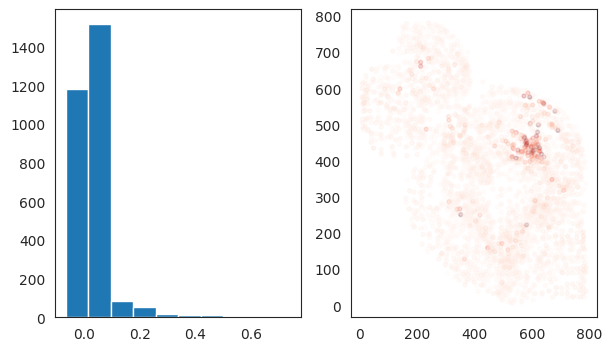

beta weights


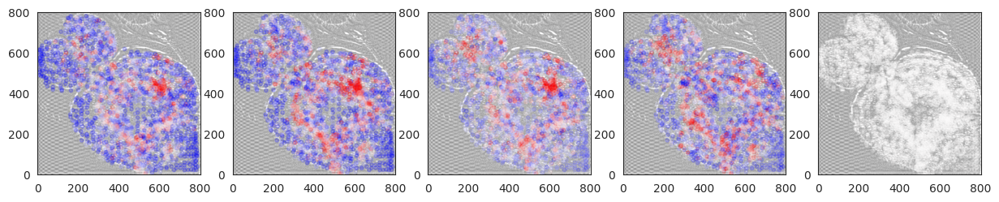

UEVs 


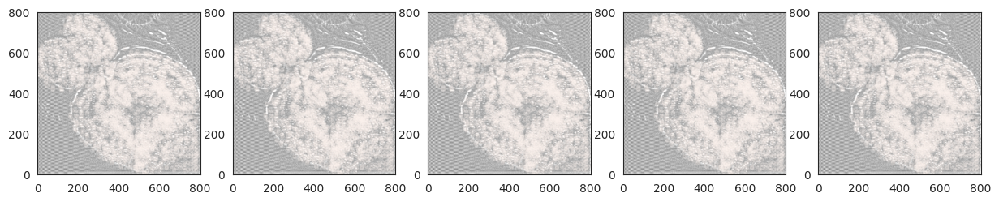

DZ-231025_f3-90_iso6_schooling


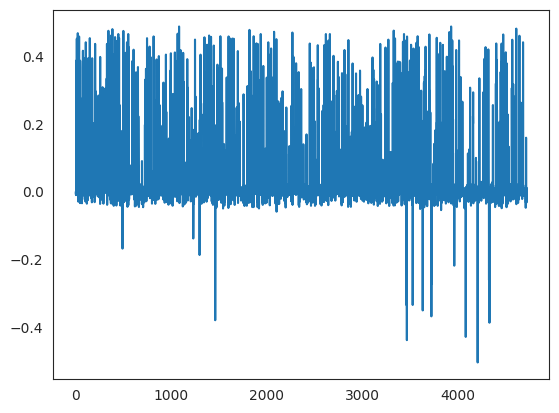

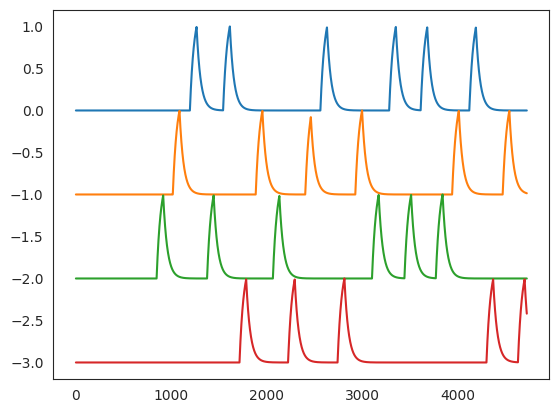

on cell #  0  of  2818 pred score 0.10514952652638976
[-1.5830300307035967, -1.815071450162147, -1.6662338939377115, -1.6300279764262613, 0.0]
on cell #  250  of  2818 pred score 0.009510286643156451
[-0.07675696306991062, 0.138959582404006, -0.39543156481700464, -0.3300710316415436, 0.0]
on cell #  500  of  2818 pred score 0.029857504310435323
[-0.8338389872422544, -1.1041189024096258, -1.122824819400859, -0.8924248584738921, 0.0]
on cell #  750  of  2818 pred score 0.16563739263262767
[0.26167139051230587, 1.523366115285115, 0.5095318407718291, 1.6949503034294604, 0.0]
on cell #  1000  of  2818 pred score 0.04882287511445149
[-0.8748962567430942, -0.7607577030080005, -0.853825018232743, -1.059785029855367, 0.0]
on cell #  1250  of  2818 pred score 0.02282852511639577
[0.9283073329560485, 0.6648448347463238, 0.6107938770355259, 0.7679238460113159, 0.0]
on cell #  1500  of  2818 pred score 0.08326639787872014
[-0.4177221931075555, 1.1773453424309797, 0.34502779081533014, 0.287382477864

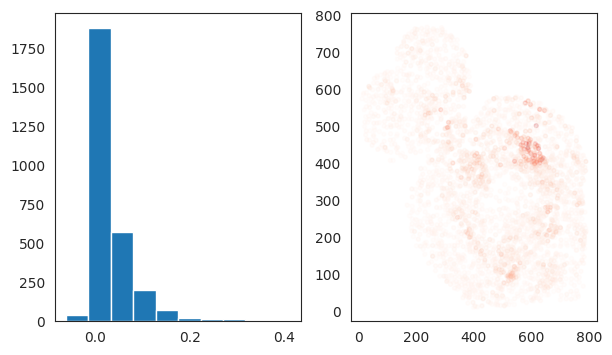

beta weights


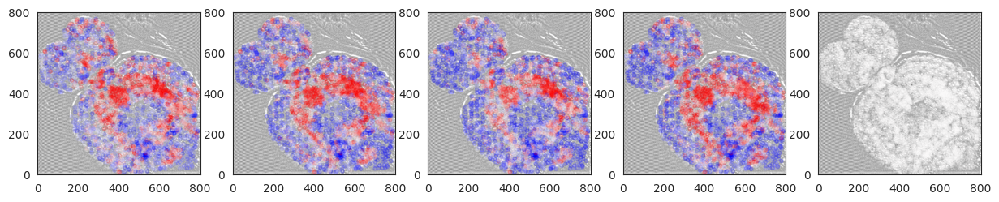

UEVs 


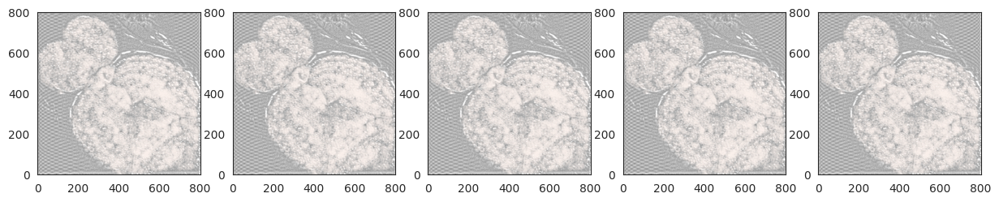

DZ-231225_f2_iso6_schooling


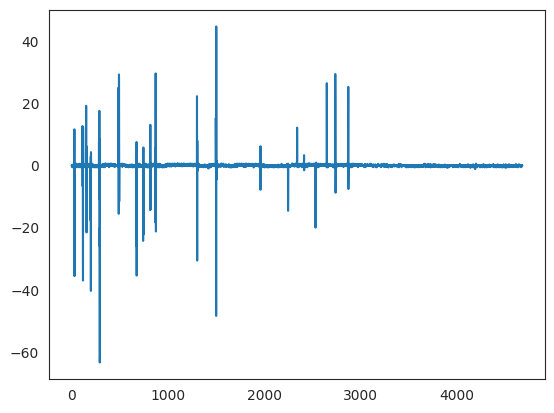

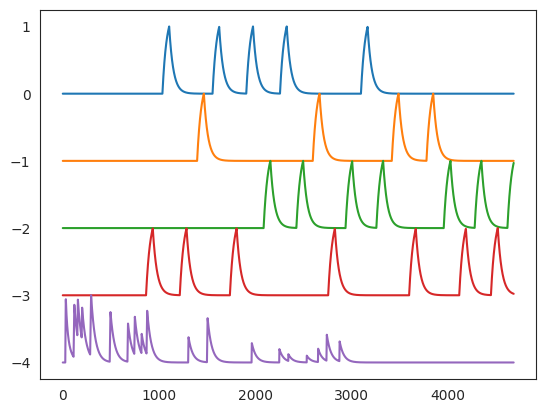

on cell #  0  of  1068 pred score 0.18681758510742985
[0.558978591887261, 2.249325498464202, 0.19908210469529863, 0.40514369316635135, -4.571245292459391]
on cell #  250  of  1068 pred score 0.1586318493368164
[0.08463980613449472, -0.44141565351399065, -0.4919819068531049, 0.7653416052956766, 8.716563807139055]
on cell #  500  of  1068 pred score 0.19506698153070956
[-1.1096161664513138, -0.9045001178102788, -1.1132660880110743, -1.303677756661557, 7.392616044741212]
on cell #  750  of  1068 pred score -0.003350694988540237
[0.028553583573144956, 0.1327342100720551, 0.10466077846297382, -0.08701124233510008, 0.03847242181498808]
on cell #  1000  of  1068 pred score 0.002778424465107121
[-0.3051921858809775, 0.31006579600336337, 0.0006992844402293033, 0.45917993996360223, 0.217021904819148]
pred (1068,) 1068
pred (5, 1068, 2) 5


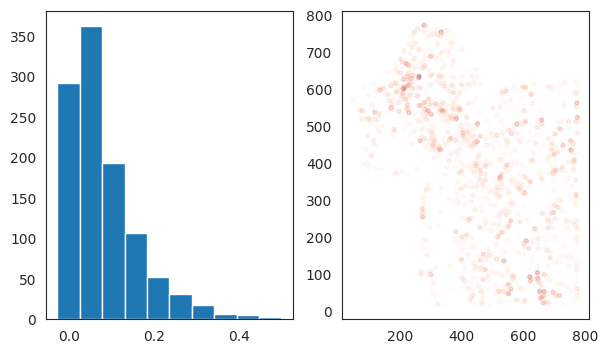

beta weights


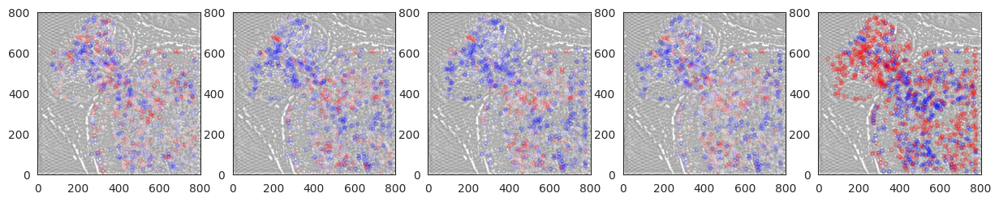

UEVs 


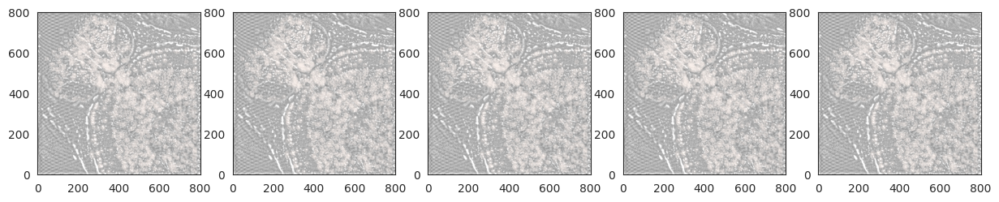

DZ-231225_f4_iso6_schooling


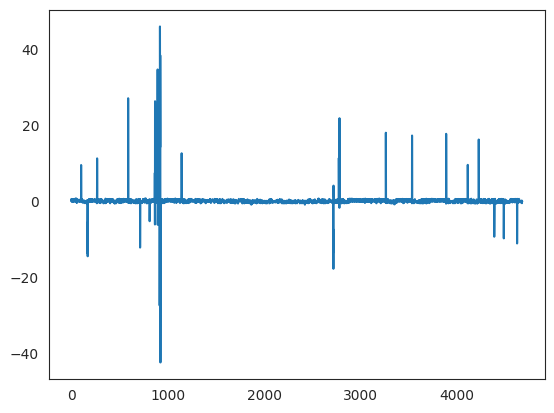

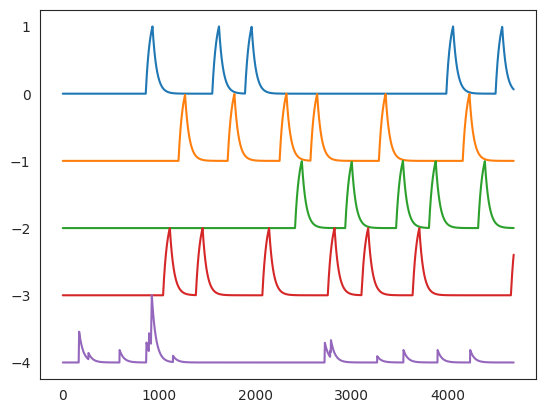

on cell #  0  of  1809 pred score 0.13151879973540237
[0.12401534474216966, -0.10299613041509083, -0.09429556669120856, 0.17638881447431895, 11.482152012276673]
on cell #  250  of  1809 pred score 0.11757624602327021
[0.5680842217088126, 0.36220716407449643, 1.1690102703484893, 1.329278444257606, 5.844501854449851]
on cell #  500  of  1809 pred score 0.4569852230524384
[2.9519438648349174, 2.3552915814596016, 2.249546501345715, 0.5841568421820974, 0.9026144545524476]
on cell #  750  of  1809 pred score 0.03738806888175472
[0.7866864852861063, 0.5825152935198892, 1.127440845785448, 1.1262448816112982, -1.0686835614349317]
on cell #  1000  of  1809 pred score 0.040855072690092586
[0.7364088941097002, -0.1716049978356071, 0.2896543628209367, -0.1362835504253613, 3.5022246141034588]
on cell #  1250  of  1809 pred score 0.08306633240513306
[1.5062846730164725, -0.0713111957984151, 0.016965309548926347, 0.2796699428083494, 4.489078097563292]
on cell #  1500  of  1809 pred score 0.09676977031

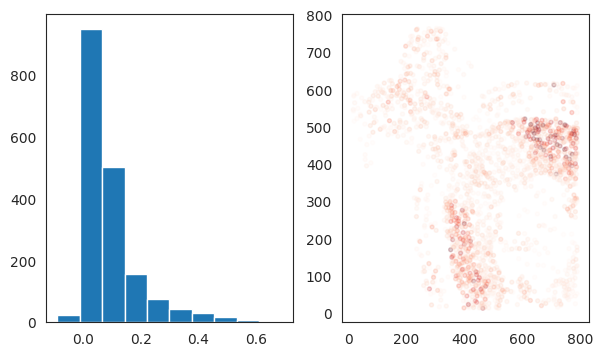

beta weights


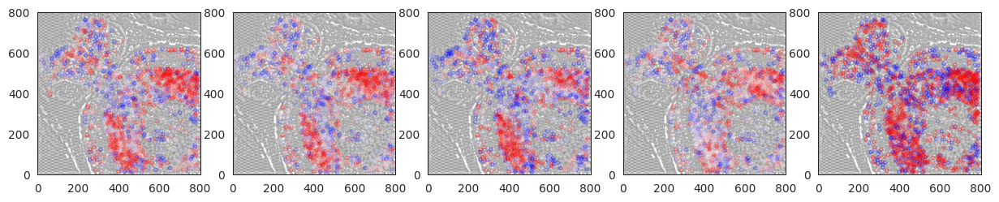

UEVs 


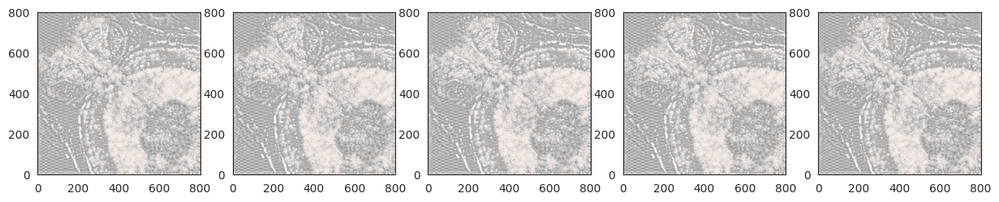

DZ-231225_f5_iso6_schooling


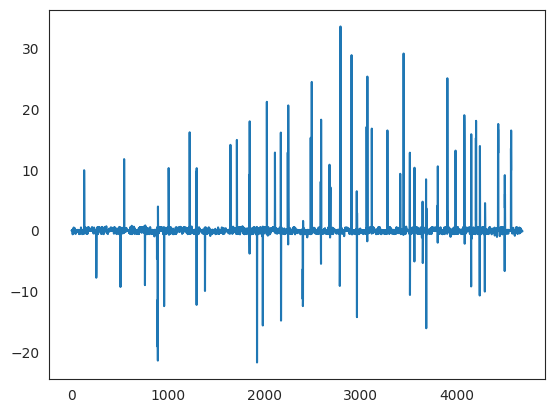

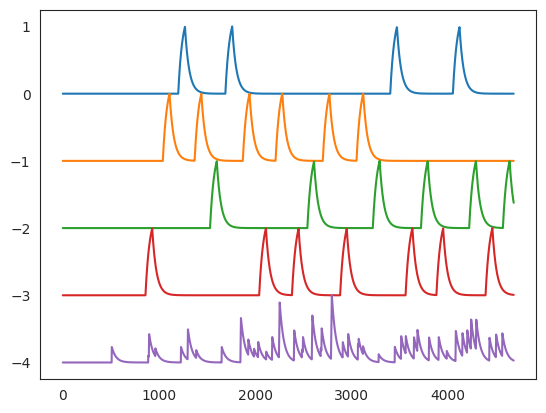

on cell #  0  of  1437 pred score 0.15676310527291892
[-1.38591521850664, -0.6950513295783355, -0.1211678408457523, 0.9275425711961542, 8.63891698337763]
on cell #  250  of  1437 pred score 0.5412893618897128
[2.957390940322063, 1.658839864497466, 3.3060456805170007, 0.2069514569987, -2.0151301515715447]
on cell #  500  of  1437 pred score 0.1454528308565073
[0.07022629328638678, -0.42318095607558703, -1.7821814215602843, 0.035590354384912405, -3.5924719900922883]
on cell #  750  of  1437 pred score 0.012208630484972893
[-0.01720704392959403, 0.3494813716350973, -0.007784049349989244, -0.11175731044879784, -0.13669655484921125]
on cell #  1000  of  1437 pred score 0.016068377020677205
[-0.26228861359550226, -0.14269462598877586, -0.6116260339567976, -0.4398306786442675, -3.2526948642586353]
on cell #  1250  of  1437 pred score -0.011860819139538625
[-0.07568464487660509, 0.6071546938897384, -0.27113999258361193, 0.3272702450335179, -1.887522057836859]
pred (1437,) 1437
pred (5, 1437, 2

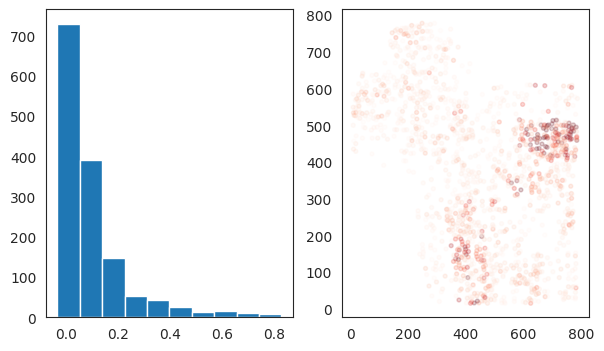

beta weights


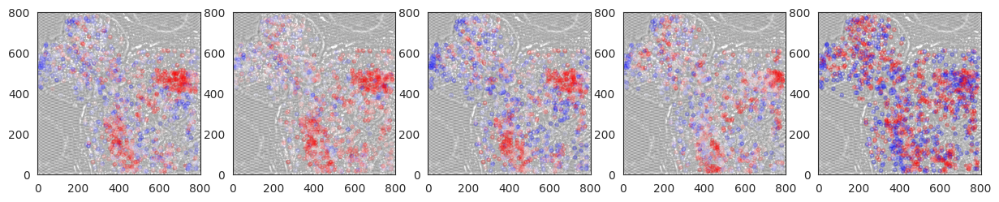

UEVs 


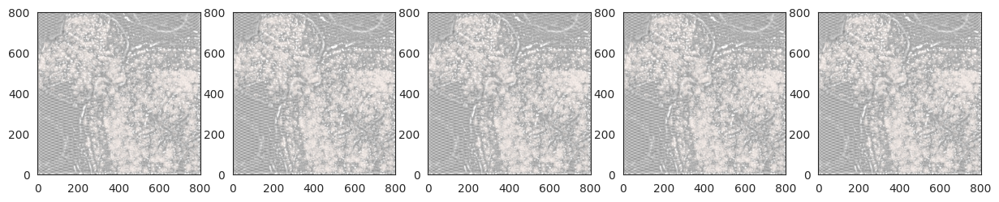

In [ ]:
#test linear model
import warnings
warnings.filterwarnings('ignore')

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects

resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use

for f in subjects:
    print(f)

    path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

    #load processed imaging data
    load = np.load(path+'neuron_details_with-anatomy.npz')
    coords = load['neuron_coordinates']
    xs=[i[0] for i in coords]
    ys=[i[1] for i in coords]
    tr=load['neuron_traces']
    neuron_locations = load['neuron_anatomy']

    output_ops =np.load(path+"suite2p/plane0/ops.npy", allow_pickle=True).item()

    load=np.load(path+'movement_stats.npz', allow_pickle=True)
    stimulus=load['stim']
    tmp=load['time_sec']
    time=[i-tmp[0] for i in tmp]
    new_time_base = int(max(time)*resample_Hz)

    tail_angle=resized(load['angle'],new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
    turn_array=resized(load['any_turn_array'],new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]

    plt.plot(tail_angle)
    plt.show()

    s0=np.zeros(len(stimulus));
    s1=np.zeros(len(stimulus));
    s2=np.zeros(len(stimulus));
    s3=np.zeros(len(stimulus));
    s4=np.zeros(len(stimulus));

    for ndx,i in enumerate(stimulus):
      if i==0:
        s0[ndx]=1
      if i==1:
        s1[ndx]=1
      if i==2:
        s2[ndx]=1
      if i==3:
        s3[ndx]=1
      if i==4:
        s4[ndx]=1

    #resample all to common Hz, and crop to first X% of behavior
    S1=resized(s1,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
    S2=resized(s2,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
    S3=resized(s3,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
    S4=resized(s4,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
    mov=turn_array

    #handle fluorescence traces here
    neuron_traces=[]
    for i in tr:
        #resize, crop, detrend, and smooth
        tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        kernel_size = int(1.0*resample_Hz) #1.0s
        kernel = np.ones(kernel_size) / kernel_size
        tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
        tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
        tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
        neuron_traces.append(scipy.stats.zscore(tmp2)) #append zscore

    #convolve regressors
    decay = 3.0*resample_Hz #(calcium decay - 3s x volume Hz sampling)
    tmp = pd.DataFrame(data=S1)
    s1_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
    tmp = pd.DataFrame(data=S2)
    s2_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
    tmp = pd.DataFrame(data=S3)
    s3_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
    tmp = pd.DataFrame(data=S4)
    s4_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
    tmp = pd.DataFrame(data=mov)
    mov_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]
    tmp = pd.DataFrame(data=tail_angle)
    tail_conv=np.array(tmp.ewm(halflife = decay).mean()).T[0]


    regressors = [s1_conv,s2_conv,s3_conv,s4_conv,mov_conv]
    for ndx,i in enumerate(regressors):
      plt.plot(norm(i)-ndx)
    plt.show()
    pred_scores, weight_set, basis_functions = linear_model(regressors, neuron_traces)
    #np.savez(path+'linear_model_outputs_ridge.npz', pred_scores=pred_scores, weight_set=weight_set, regressors=regressors)

    #plotting
    for yyy in [pred_scores, weight_set]:
        print('pred', np.shape(yyy), np.shape(yyy)[0])

    plt.figure(figsize=[7,4])
    plt.subplot(121)
    plt.hist(pred_scores)
    plt.subplot(122)
    plt.scatter(xs,ys,c=pred_scores, cmap='Reds', s=8, alpha=0.2, vmin=0, vmax=0.5)
    plt.show()


    #plotting beta weights of model
    print('beta weights')
    plt.figure(figsize=[15,5])
    for ndx,wt in enumerate(weight_set):
      plt.subplot(1,len(weight_set),ndx+1)
      plt.imshow(output_ops['meanImgE'], cmap='gray', alpha=0.6)
      plt.scatter(xs,ys,c=[np.mean(i[0]) for i in wt], cmap='bwr', s=10, alpha=0.2, vmin=-1, vmax=1)
      plt.xlim(0,800)
      plt.ylim(0,800)
    plt.show()

    #plotting UEVs of model
    print('UEVs ')
    plt.figure(figsize=[15,5])
    for ndx,wt in enumerate(weight_set):
      plt.subplot(1,len(weight_set),ndx+1)
      plt.imshow(output_ops['meanImgE'], cmap='gray', alpha=0.6)
      plt.scatter(xs,ys,c=[np.mean(i[1]) for i in wt], cmap='Reds', s=10, alpha=0.2, vmin=0, vmax=0.1)
      plt.xlim(0,800)
      plt.ylim(0,800)
    plt.show()



DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
telencephalon
SHOWING PLOTS FOR REGRESSOR  s1
s1 betas
group[T.iso]: p-value = 0.131233
SHOWING PLOTS FOR REGRESSOR  s2
s2 betas
group[T.iso]: p-value = 0.006494
SHOWING PLOTS FOR REGRESSOR  s3
s3 betas
group[T.iso]: p-value = 0.000177
SHOWING PLOTS FOR REGRESSOR  s4
s4 betas
group[T.iso]: p-value = 0.280807
SHOWING PLOTS FOR REGRESSOR  mov
mov betas
group[T.iso]: p-value = 0.452548


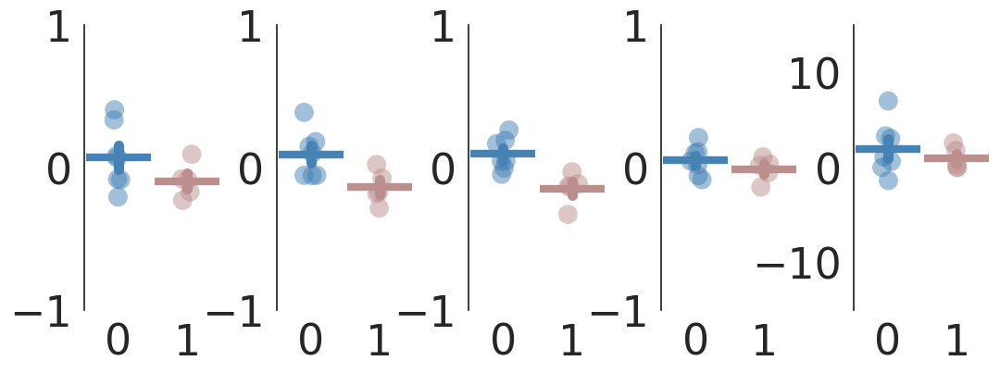

DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
dienencephalon
SHOWING PLOTS FOR REGRESSOR  s1
s1 betas
group[T.iso]: p-value = 0.690929
SHOWING PLOTS FOR REGRESSOR  s2
s2 betas
group[T.iso]: p-value = 0.458052
SHOWING PLOTS FOR REGRESSOR  s3
s3 betas
group[T.iso]: p-value = 0.520702
SHOWING PLOTS FOR REGRESSOR  s4
s4 betas
group[T.iso]: p-value = 0.690672
SHOWING PLOTS FOR REGRESSOR  mov
mov betas
group[T.iso]: p-value = 0.041746


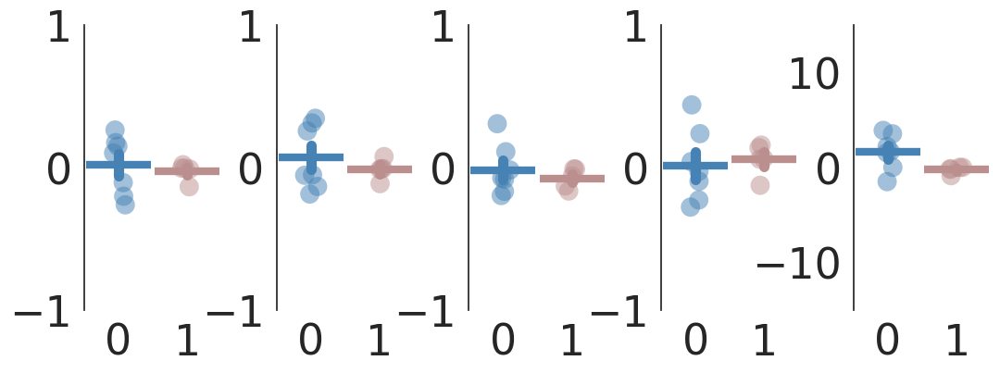

DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
mesencephalon
SHOWING PLOTS FOR REGRESSOR  s1
s1 betas
group[T.iso]: p-value = 0.272589
SHOWING PLOTS FOR REGRESSOR  s2
s2 betas
group[T.iso]: p-value = 0.030591
SHOWING PLOTS FOR REGRESSOR  s3
s3 betas
group[T.iso]: p-value = 0.010924
SHOWING PLOTS FOR REGRESSOR  s4
s4 betas
group[T.iso]: p-value = 0.690550
SHOWING PLOTS FOR REGRESSOR  mov
mov betas
group[T.iso]: p-value = 0.128459


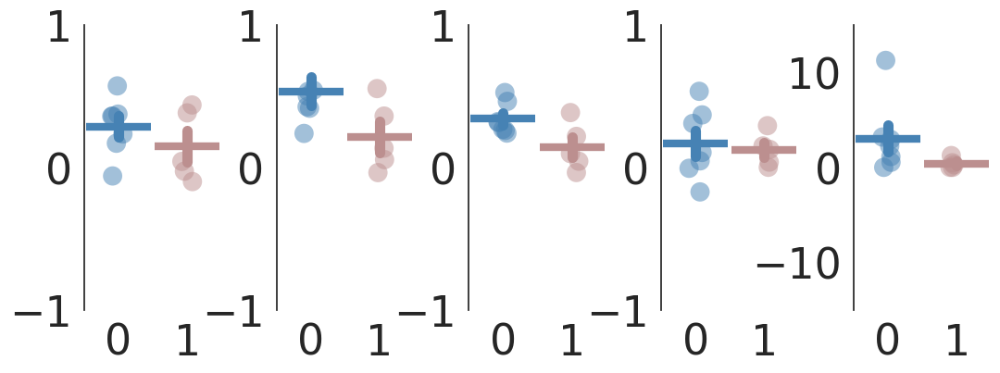

DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
rhombencephalon
SHOWING PLOTS FOR REGRESSOR  s1
s1 betas
group[T.iso]: p-value = 0.273428
SHOWING PLOTS FOR REGRESSOR  s2
s2 betas
group[T.iso]: p-value = 0.455681
SHOWING PLOTS FOR REGRESSOR  s3
s3 betas
group[T.iso]: p-value = 0.196093
SHOWING PLOTS FOR REGRESSOR  s4
s4 betas
group[T.iso]: p-value = 0.662744
SHOWING PLOTS FOR REGRESSOR  mov
mov betas
group[T.iso]: p-value = 0.924130


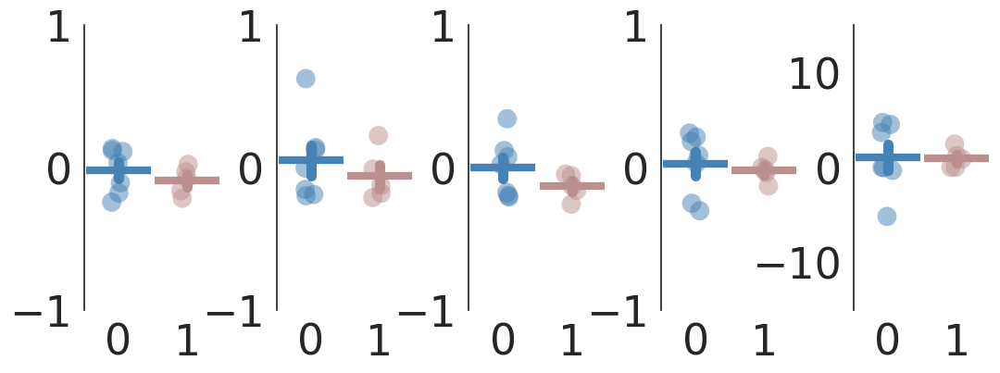

In [ ]:
#individual neuron stats (betas, etc)

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects

brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']

brain_region_groupings = [['telencephalon', 'dorsal_forebrain', 'ventral_forebrain'],\
                          ['dienencephalon', 'habenula','thalamus'],\
                          ['mesencephalon', 'left_tectum_neuropil', 'left_tectum_cell-layer','right_tectum_neuropil', 'right_tectum_cell-layer'],\
                          ['rhombencephalon', 'cerebellum', 'hindbrain']]


for region in brain_region_groupings: #['k']:

    b_wk6_iso={}; b_wk6={}; #betas
    for i in ['f_id','f_grp','s1','s2','s3','s4','mov','s1_byfish','s2_byfish','s3_byfish','s4_byfish','mov_byfish']: #each stimulus type
      b_wk6_iso[i]=[]; b_wk6[i]=[];

    for f in subjects:

      print(f)
      path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

      load = np.load(path+'neuron_details_with-anatomy.npz', allow_pickle=True)
      neuron_locations = load['neuron_anatomy']

      load=np.load(path+'linear_model_outputs_ridge.npz', allow_pickle=True)
      pred_scores=load['pred_scores']
      weight_set=load['weight_set']


      if f in iso6_subjects:
        for index,(weights,regs,regs_byfish) in enumerate(zip(weight_set, ['s1','s2','s3','s4','mov'],['s1_byfish','s2_byfish','s3_byfish','s4_byfish','mov_byfish'])):
          b_wk6_iso[regs_byfish].append(np.mean([np.mean(i[0]) for i,loc in zip(weights,neuron_locations) if loc in region]))
          for i,j,loc in zip(weights,pred_scores,neuron_locations):
            if loc in region:
              b_wk6_iso[regs].append(np.mean(i[0]))
              if index==0:
                b_wk6_iso['f_id'].append(f)#ndx)
                b_wk6_iso['f_grp'].append('iso')


      if f in wk6_subjects:
        for index,(weights,regs,regs_byfish) in enumerate(zip(weight_set, ['s1','s2','s3','s4','mov'],['s1_byfish','s2_byfish','s3_byfish','s4_byfish','mov_byfish'])):
          b_wk6[regs_byfish].append(np.mean([np.mean(i[0]) for i,loc in zip(weights,neuron_locations) if loc in region]))
          for i,j,loc in zip(weights,pred_scores,neuron_locations):
            if loc in region:
              b_wk6[regs].append(np.mean(i[0]))
              if index==0:
                b_wk6['f_id'].append(f)#ndx)
                b_wk6['f_grp'].append('ctrl')

    plt.figure(figsize=[18,4])
    plt.tight_layout(pad=10.0)
    plt.ylabel('mean beta')
    print(region[0])
    for ndx,(regs,regs_byfish) in enumerate(zip(['s1','s2','s3','s4','mov'],['s1_byfish','s2_byfish','s3_byfish','s4_byfish','mov_byfish'])):

      print("SHOWING PLOTS FOR REGRESSOR ", regs)

      #betas from model
      plt.subplot(1,7,ndx+2)
      print(regs+" betas")
      summary_data = [b_wk6[regs],b_wk6_iso[regs]]
      summary_data_byfish = [b_wk6[regs_byfish],b_wk6_iso[regs_byfish]]
      summary_fids = [b_wk6['f_id'], b_wk6_iso['f_id']]
      summary_grps = [b_wk6['f_grp'], b_wk6_iso['f_grp']]

      sns.pointplot(data=summary_data_byfish, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
      sns.stripplot(data=summary_data_byfish, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)

      if regs=='mov':
        plt.ylim(-15,15)
      else:
        plt.ylim(-1,1)

      sns.despine(top=True, right=True, bottom=True)

      df = pd.DataFrame({
                  'cell_values': np.concatenate([b_wk6[regs],b_wk6_iso[regs]]),
                  'group': np.concatenate([b_wk6['f_grp'],b_wk6_iso['f_grp']]),
                  'fish_ID': np.concatenate([b_wk6['f_id'],b_wk6_iso['f_id']]),
                  })

      # Convert 'group' to categorical if it's not already
      df['group'] = df['group'].astype('category')

      # Fit the linear mixed-effects model
      model = smf.mixedlm("cell_values ~ group", df, groups=df['fish_ID'])
      result = model.fit()

      # Print the summary of the model
      #print(result.summary())
      p_values = result.pvalues
      # Print p-values with increased precision
      for index,(param, p_value) in enumerate(p_values.items()):
          if index==1:
            print(f"{param}: p-value = {p_value:.6f}")

    plt.subplots_adjust(hspace=0.5, wspace=0.4)
    plt.savefig(figure_savepath +"model_betas_"+region[0]+".pdf", transparent=True, bbox_inches='tight', pad_inches=0.2)
    plt.show()



['telencephalon', 'dorsal_forebrain', 'ventral_forebrain']
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
number of  cells in telencephalon


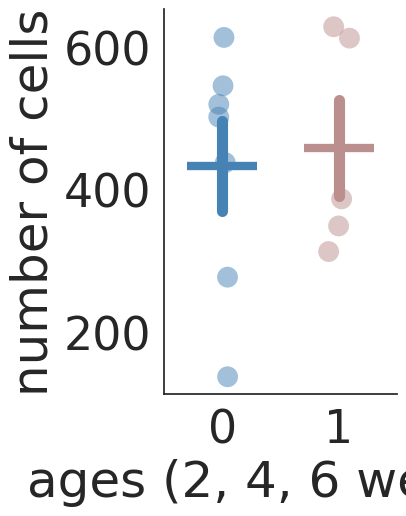

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  0.05934065934066268 P-value:  0.8075411062892531
max zscore for cells in telencephalon


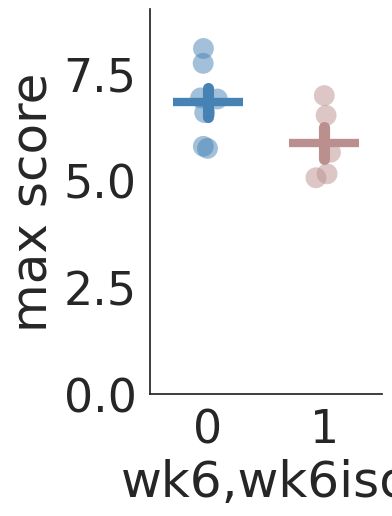

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  2.907692307692308 P-value:  0.08815793541979447
shape of data is 
(7,)
(5,)
['dienencephalon', 'habenula', 'thalamus']
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
number of  cells in dienencephalon


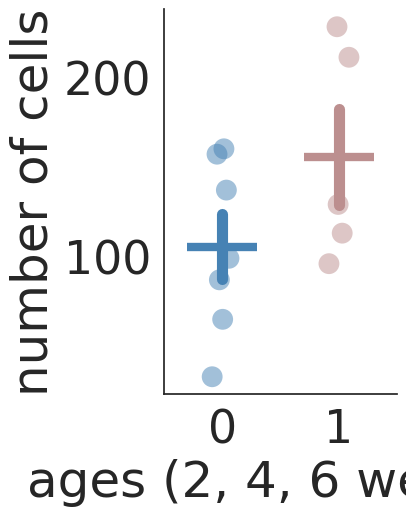

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  1.4835164835164818 P-value:  0.2232251453067525
max zscore for cells in dienencephalon


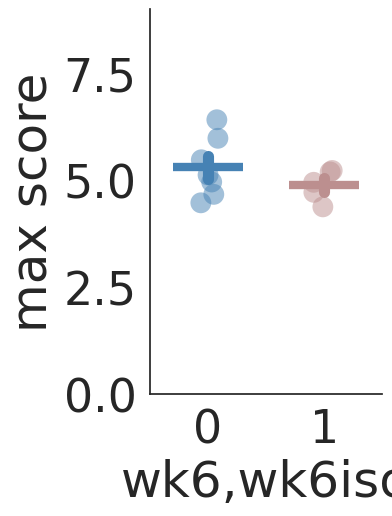

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  0.7978021978022056 P-value:  0.3717512896455586
shape of data is 
(7,)
(5,)
['mesencephalon', 'left_tectum_neuropil', 'left_tectum_cell-layer', 'right_tectum_neuropil', 'right_tectum_cell-layer']
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
number of  cells in mesencephalon


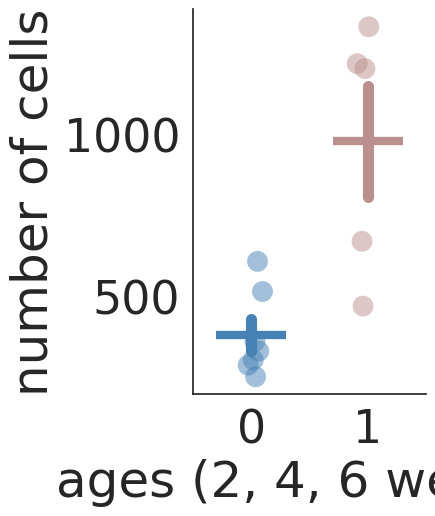

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  6.336263736263746 P-value:  0.011829380109451598
              wk6   wk6_iso
wk6      1.000000  0.011829
wk6_iso  0.011829  1.000000
max zscore for cells in mesencephalon


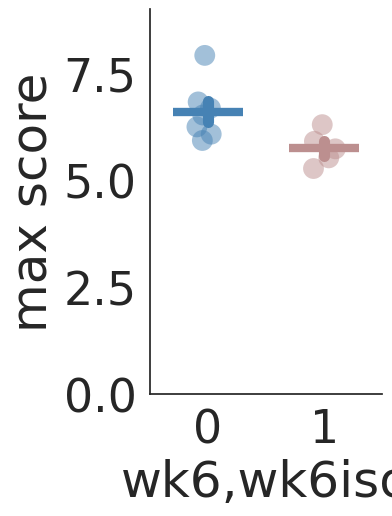

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  5.54505494505495 P-value:  0.0185329748770265
              wk6   wk6_iso
wk6      1.000000  0.018533
wk6_iso  0.018533  1.000000
shape of data is 
(7,)
(5,)
['rhombencephalon', 'cerebellum', 'hindbrain']
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230525-f1-130_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
number of  cells in rhombencephalon


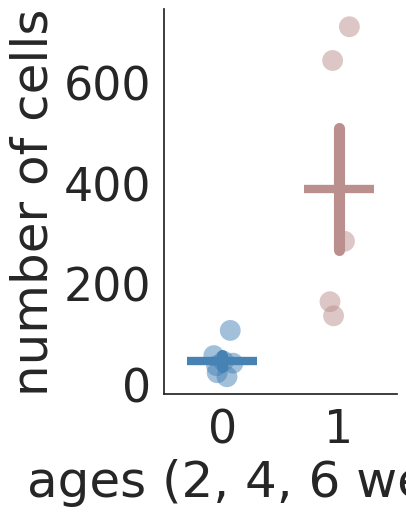

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  8.07692307692308 P-value:  0.004483250402085375
              wk6   wk6_iso
wk6      1.000000  0.004483
wk6_iso  0.004483  1.000000
max zscore for cells in rhombencephalon


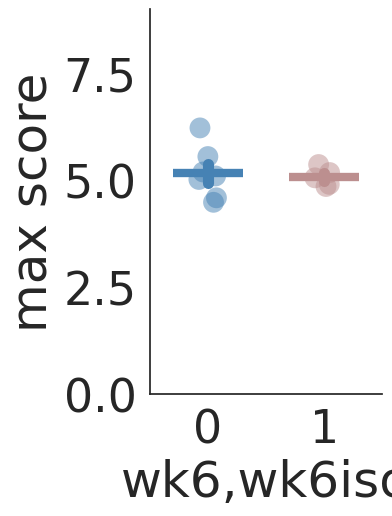

statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)
H-statistic:  0.05934065934066268 P-value:  0.8075411062892531
shape of data is 
(7,)
(5,)


In [ ]:
#get plots of simple metrics (# of cells per region, max dF/F, standard deviation)

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects


brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']

brain_region_groupings = [['telencephalon', 'dorsal_forebrain', 'ventral_forebrain'],\
                          ['dienencephalon', 'habenula','thalamus'],\
                          ['mesencephalon', 'left_tectum_neuropil', 'left_tectum_cell-layer','right_tectum_neuropil', 'right_tectum_cell-layer'],\
                          ['rhombencephalon', 'cerebellum', 'hindbrain']]


resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use (omit first 5%)

for region in brain_region_groupings:
    print(region)

    wk6=[]; wk6_iso=[];
    cellwk6_iso=[]; cellwk6=[];

    for f in subjects:
        print(f)

        path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

        #load processed imaging data
        load = np.load(path+'neuron_details_with-anatomy.npz', allow_pickle=True)
        coords = load['neuron_coordinates']
        xs=[i[0] for i in coords]
        ys=[i[1] for i in coords]
        tr=load['neuron_traces']
        neuron_locations = load['neuron_anatomy']

        load=np.load(path+'movement_stats.npz', allow_pickle=True)
        tmp=load['time_sec']
        time=[i-tmp[0] for i in tmp]
        new_time_base = int(max(time)*resample_Hz)

        #handle fluorescence traces here
        neuron_traces=[]
        for i,loc in zip(tr,neuron_locations):
          if loc in region:
            tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
            kernel_size = int(1.0*resample_Hz) #1.0s
            kernel = np.ones(kernel_size) / kernel_size
            tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
            tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
            tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
            neuron_traces.append(scipy.stats.zscore(tmp2)) #append zscore

        if f in iso6_subjects:
          cellwk6_iso.append(len(neuron_traces))
          wk6_iso.append(np.mean([max(tr) for tr in neuron_traces]))


        if f in wk6_subjects:
          cellwk6.append(len(neuron_traces))
          wk6.append(np.mean([max(tr) for tr in neuron_traces]))


    plt.figure(figsize=[3,5])
    plt.tight_layout(pad=10.0)
    print("number of  cells in "+region[0])
    summary_data = [cellwk6,cellwk6_iso]
    sns.pointplot(data=summary_data, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
    sns.stripplot(data=summary_data, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)
    plt.xlabel('ages (2, 4, 6 weeks)')
    plt.ylabel('number of cells')
    sns.despine()
    plt.savefig(figure_savepath +"cellcount_region_"+region[0]+".pdf", transparent=True, bbox_inches='tight', pad_inches=0.2)
    plt.show()

    print('statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)')
    data = pd.DataFrame({
          'value': np.concatenate(summary_data),
          'group': np.repeat(['wk6', 'wk6_iso'],
                        repeats=[len(summary_data[n]) for n in range(len(summary_data))])})
    # Kruskal-Wallis test
    h_statistic, p_value = stats.kruskal(summary_data[0],summary_data[1])
    print("H-statistic: ", h_statistic, "P-value: ", p_value)
    # If p-value < 0.05, we can perform post hoc test (Dunn)
    if p_value < 0.05:
        posthoc = sp.posthoc_dunn(data, val_col='value', group_col='group', p_adjust='bonferroni')
        print(posthoc)


    plt.figure(figsize=[3,5])
    plt.tight_layout(pad=10.0)
    print("max zscore for cells in "+region[0])
    summary_data = [wk6,wk6_iso]
    sns.pointplot(data=summary_data, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
    sns.stripplot(data=summary_data, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)
    plt.xlabel('wk6,wk6iso')
    plt.ylabel('max score')
    plt.ylim(0,9)
    sns.despine()
    plt.savefig(figure_savepath +"max_Zscore_region_"+region[0]+".pdf", transparent=True, bbox_inches='tight', pad_inches=0.2)
    plt.show()

    print('statistics for comparison: Kruskal-Wallis test with posthoc Dunns comparison (bonferroni corrected)')
    data = pd.DataFrame({
          'value': np.concatenate(summary_data),
          'group': np.repeat(['wk6', 'wk6_iso'],
                        repeats=[len(summary_data[n]) for n in range(len(summary_data))])})
    # Kruskal-Wallis test
    h_statistic, p_value = stats.kruskal(summary_data[0],summary_data[1])
    print("H-statistic: ", h_statistic, "P-value: ", p_value)
    # If p-value < 0.05, we can perform post hoc test (Dunn)
    if p_value < 0.05:
        posthoc = sp.posthoc_dunn(data, val_col='value', group_col='group', p_adjust='bonferroni')
        print(posthoc)

    print('shape of data is ')
    for i in summary_data:
      print(np.shape(i))


-0.5481738141478406
DZ-230529_wk6_f1_-130_schooling 193 (193, 5187) 0.14544084400904295  of cells
PCA within brain region DZ-230529_wk6_f1_-130_schooling
-0.8023528333749724
DZ-230529_wk6_f2_-110_schooling 80 (80, 5187) 0.1225114854517611  of cells
PCA within brain region DZ-230529_wk6_f2_-110_schooling
-4.2024418055275214
DZ-230526-f1-140_6wk_schooling 45 (45, 5187) 0.04297994269340974  of cells
PCA within brain region DZ-230526-f1-140_6wk_schooling
-1.2007779265689567
DZ-230525-f1-130_6wk_schooling 121 (121, 4446) 0.11713455953533398  of cells
PCA within brain region DZ-230525-f1-130_6wk_schooling
-1.0116401097392314
DZ-230524_wk6_f1-2_schooling 102 (102, 5187) 0.12274368231046931  of cells
PCA within brain region DZ-230524_wk6_f1-2_schooling
-0.9170812097073247
DZ-230522_wk6_f2-2_schooling 168 (168, 5187) 0.12933025404157045  of cells
PCA within brain region DZ-230522_wk6_f2-2_schooling
-1.7115858405734732
DZ-230521_wk6_f2_schooling 70 (70, 5187) 0.12323943661971831  of cells
PCA wi

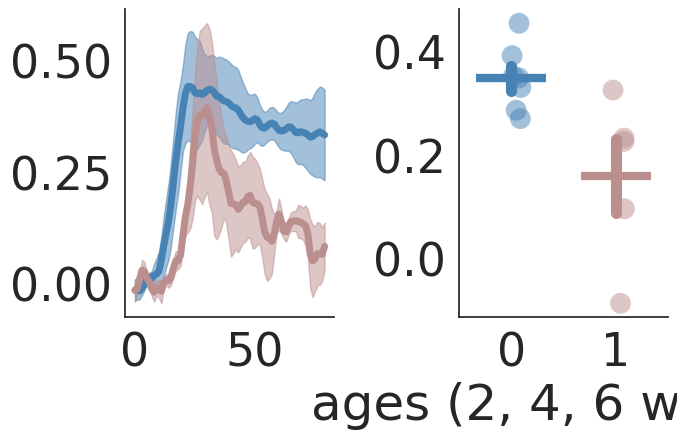

statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)
t-statistic:  2.885847899763469 P-value:  0.016222161604449975
group #, N, MEANS, and SEM
0 7 0.3481639956111273 0.023636385458910347
normality test is ShapiroResult(statistic=0.9583802819252014, pvalue=0.8047241568565369)
1 5 0.15885486228663562 0.07143068676747363
normality test is ShapiroResult(statistic=0.9238373637199402, pvalue=0.554990828037262)
cos dist. in PC space for comparison obj-v-drift
cos dist., PCA space


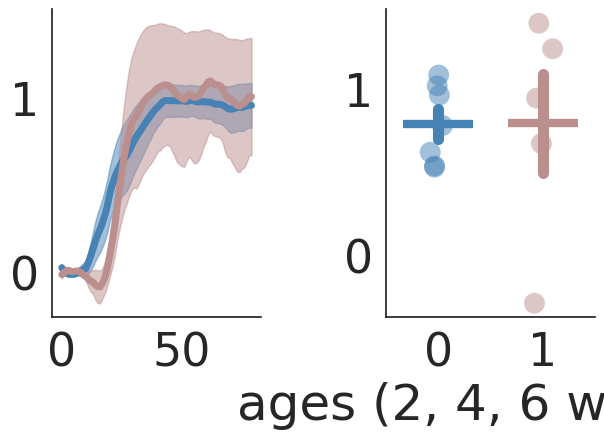

statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)
t-statistic:  -0.009565886552856858 P-value:  0.9925557915693359
group #, N, MEANS, and SEM
0 7 0.7870301174253294 0.08827738607354992
normality test is ShapiroResult(statistic=0.8839857578277588, pvalue=0.2447359710931778)
1 5 0.7895889676656782 0.2966239875592641
normality test is ShapiroResult(statistic=0.8913907408714294, pvalue=0.36414483189582825)


In [ ]:
#look at trial-averaged trajectories in PCA space, and ask how they differ between trial types
#Cosine distance

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects

resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use

wk6_iso={}; wk6={}; #summary stats for each age group
for i in ['all_obj','obj-v-drift']: #stimulus comparisons
      wk6_iso[i]=[]; wk6[i]=[];

for f in subjects:

        path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

        load = np.load(path+'neuron_details_with-anatomy.npz')
        coords = load['neuron_coordinates']
        xs=[i[0] for i in coords]
        ys=[i[1] for i in coords]
        tra=load['neuron_traces']
        neuron_locations = load['neuron_anatomy']

        load=np.load(path+'linear_model_outputs_ridge.npz', allow_pickle=True)
        pred_scores=load['pred_scores']


        print(np.mean(pred_scores))

        load=np.load(path+'movement_stats.npz', allow_pickle=True)
        tmp=load['time_sec']
        time=[i-tmp[0] for i in tmp]
        new_time_base = int(max(time)*resample_Hz)
        tail_angle=resized(load['angle'],new_time_base)
        turn_array=resized(load['any_turn_array'],new_time_base)
        stimulus=load['stim']

        s0=np.zeros(len(stimulus));
        s1=np.zeros(len(stimulus));
        s2=np.zeros(len(stimulus));
        s3=np.zeros(len(stimulus));
        s4=np.zeros(len(stimulus));

        for ndx,i in enumerate(stimulus):
          if i==0:
            s0[ndx]=1
          if i==1:
            s1[ndx]=1
          if i==2:
            s2[ndx]=1
          if i==3:
            s3[ndx]=1
          if i==4:
            s4[ndx]=1

        #resample all to common Hz, and crop to first X% of behavior
        S1=resized(s1,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S2=resized(s2,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S3=resized(s3,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S4=resized(s4,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]

        #get stimulus onset times
        post_stim_dur=7*resample_Hz   #post-stimulus duration (s)

        S1_ON = [ndx for ndx,i in enumerate(S1) if i>0 and S1[ndx-1]==0 and resample_Hz < ndx < len(S1)-post_stim_dur]
        S2_ON = [ndx for ndx,i in enumerate(S2) if i>0 and S2[ndx-1]==0 and resample_Hz < ndx < len(S2)-post_stim_dur]
        S3_ON = [ndx for ndx,i in enumerate(S3) if i>0 and S3[ndx-1]==0 and resample_Hz < ndx < len(S3)-post_stim_dur]
        S4_ON = [ndx for ndx,i in enumerate(S4) if i>0 and S4[ndx-1]==0 and resample_Hz < ndx < len(S4)-post_stim_dur]

        #handle fluorescence traces here
        neuron_traces=[]
        for i,pred in zip(tra,pred_scores):
          if pred > 0:
            tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
            kernel_size = int(1.0*resample_Hz) #1.0s
            kernel = np.ones(kernel_size) / kernel_size
            tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
            tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
            tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
            neuron_traces.append(scipy.stats.zscore(tmp2))


        print(f, len(neuron_traces), np.shape(neuron_traces), len(neuron_traces)/len(tra), " of cells")

        #trajectory in PCA space
        print('PCA within brain region', f)
        N_components=10

        if len(neuron_traces)>N_components:

          #center here (mean-subtract)
          centered_traces = [t-np.mean(t) for t in neuron_traces]

          PCs = {}; tPCs=[]
          pca=PCA(n_components=N_components)
          pca.fit(centered_traces)
          weights = pca.fit_transform(centered_traces)
          explained_variance_ratio = pca.explained_variance_ratio_

          for i in range(N_components): #using first 10 components (of N_components)
            PCs["pc"+str(i)] = [m[i]*n for m,n in zip(weights, centered_traces)]
            tpc_tmp = np.mean(PCs["pc"+str(i)], axis=0)
            tPCs.append(tpc_tmp)

          #plot cosine distance
          s1_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S1_ON], axis=0) for t in tPCs])
          s2_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S2_ON], axis=0) for t in tPCs])
          s3_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S3_ON], axis=0) for t in tPCs])
          s4_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S4_ON], axis=0) for t in tPCs])

          if f in iso6_subjects:
            wk6_iso['all_obj'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s2_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s1_pca.T, s3_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s3_pca.T, metric='cosine')],axis=0))
            wk6_iso['obj-v-drift'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s4_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s4_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s3_pca.T, s4_pca.T, metric='cosine')],axis=0))
          if f in wk6_subjects:
            wk6['all_obj'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s2_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s1_pca.T, s3_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s3_pca.T, metric='cosine')],axis=0))
            wk6['obj-v-drift'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s4_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s4_pca.T, metric='cosine'),
                                           sklearn.metrics.pairwise.paired_distances(s3_pca.T, s4_pca.T, metric='cosine')],axis=0))


for comparison in ['all_obj', 'obj-v-drift']:

      plt.figure(figsize=[7,4])
      plt.tight_layout()
      plt.subplot(121)
      #plt.axvline(resample_Hz, color='0.3', linewidth=2.0, alpha=0.5)
      colorz = ['steelblue', 'rosybrown']

      summary_data=[]
      for i,color in zip([wk6[comparison],wk6_iso[comparison]], colorz):

          i = [x-np.mean(x[:resample_Hz]) for x in i] #baseline subtraction

          summary_data.append([np.mean(x[resample_Hz:]) for x in i])

          plt.plot(np.mean(i, axis = 0), color = color, linewidth=5)
          plt.fill_between(np.arange(np.mean(i, axis=0).shape[0]),
            np.mean(i, axis=0)+scipy.stats.sem(i, axis= 0),
            np.mean(i, axis=0)-scipy.stats.sem(i, axis=0), color=color, alpha=0.5)
          #plt.ylim(0,35)
      print("cos dist. in PC space for comparison "+comparison)
      sns.despine()


      plt.subplot(122)

      summary_data=[]
      for i,color in zip([wk6[comparison],wk6_iso[comparison]], colorz):

          i = [x-np.mean(x[:resample_Hz]) for x in i] #baseline subtraction

          summary_data.append([np.mean(x[resample_Hz:]) for x in i]) #mean in _ s post stimulus

      sns.pointplot(data=summary_data, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
      sns.stripplot(data=summary_data, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)
      plt.xlabel('ages (2, 4, 6 weeks)')
      print('cos dist., PCA space')
      sns.despine()

      plt.subplots_adjust(hspace=0.1, wspace=0.6)
      plt.savefig(figure_savepath+"wholebrain_summary_cosine_PC_space_"+comparison+".pdf", transparent=True)
      plt.show()

      print('statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)')
      data = pd.DataFrame({
            'value': np.concatenate(summary_data),
            'group': np.repeat(['wk6', 'wk6_iso'],
                              repeats=[len(summary_data[0]), len(summary_data[1])])
        })

      #tt test
      t_statistic, p_value = stats.ttest_ind(summary_data[0], summary_data[1])
      print("t-statistic: ", t_statistic, "P-value: ", p_value)


      print("group #, N, MEANS, and SEM")
      for ndx,i in enumerate(summary_data):
        print(ndx, len(i), np.mean(i), scipy.stats.sem(i))
        print('normality test is', scipy.stats.shapiro(i))


-0.5481738141478406
DZ-230529_wk6_f1_-130_schooling 193 (193, 5187) 0.14544084400904295  of cells
PCA within brain region DZ-230529_wk6_f1_-130_schooling
-0.8023528333749724
DZ-230529_wk6_f2_-110_schooling 80 (80, 5187) 0.1225114854517611  of cells
PCA within brain region DZ-230529_wk6_f2_-110_schooling
-4.2024418055275214
DZ-230526-f1-140_6wk_schooling 45 (45, 5187) 0.04297994269340974  of cells
PCA within brain region DZ-230526-f1-140_6wk_schooling
-1.2007779265689567
DZ-230525-f1-130_6wk_schooling 121 (121, 4446) 0.11713455953533398  of cells
PCA within brain region DZ-230525-f1-130_6wk_schooling
-1.0116401097392314
DZ-230524_wk6_f1-2_schooling 102 (102, 5187) 0.12274368231046931  of cells
PCA within brain region DZ-230524_wk6_f1-2_schooling
-0.9170812097073247
DZ-230522_wk6_f2-2_schooling 168 (168, 5187) 0.12933025404157045  of cells
PCA within brain region DZ-230522_wk6_f2-2_schooling
-1.7115858405734732
DZ-230521_wk6_f2_schooling 70 (70, 5187) 0.12323943661971831  of cells
PCA wi

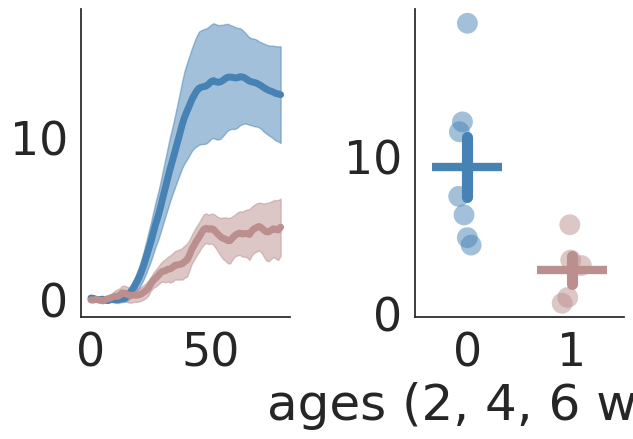

statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)
t-statistic:  2.7056977328483733 P-value:  0.022096191870875997
group #, N, MEANS, and SEM
0 7 9.294992280881326 1.9227625746383223
normality test is ShapiroResult(statistic=0.8966087102890015, pvalue=0.31093791127204895)
1 5 2.730906545031757 0.9052166892859136
normality test is ShapiroResult(statistic=0.9303221702575684, pvalue=0.598569393157959)
euc dist. in PC space for comparison obj-v-drift
cos dist., PCA space


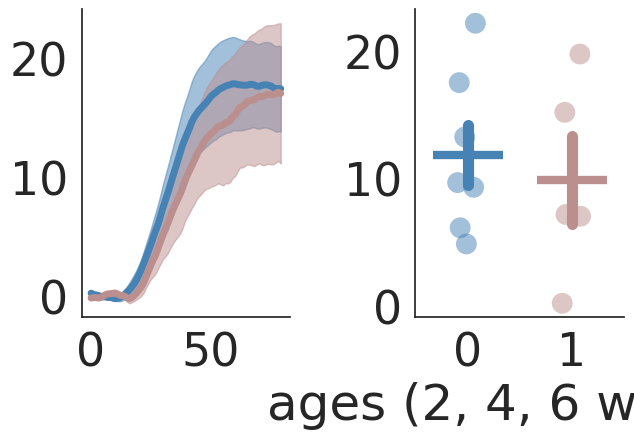

statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)
t-statistic:  0.4925358081864359 P-value:  0.632974825709077
group #, N, MEANS, and SEM
0 7 11.869026473599124 2.3612963521565966
normality test is ShapiroResult(statistic=0.9377248287200928, pvalue=0.6183205246925354)
1 5 9.892617429555601 3.431176806518358
normality test is ShapiroResult(statistic=0.9536401033401489, pvalue=0.7631498575210571)


In [ ]:
#look at trial-averaged trajectories in PCA space, and ask how they differ between trial types
#euclidean distance

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230525-f1-130_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects


resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use

wk6_iso={}; wk6={}; #summary stats for each age group
for i in ['all_obj','obj-v-drift']: #stimulus comparisons
      wk6_iso[i]=[]; wk6[i]=[];

for f in subjects:

        path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

        load = np.load(path+'neuron_details_with-anatomy.npz')
        coords = load['neuron_coordinates']
        xs=[i[0] for i in coords]
        ys=[i[1] for i in coords]
        tra=load['neuron_traces']
        neuron_locations = load['neuron_anatomy']

        load=np.load(path+'linear_model_outputs_ridge.npz', allow_pickle=True)
        pred_scores=load['pred_scores']

        print(np.mean(pred_scores))

        load=np.load(path+'movement_stats.npz', allow_pickle=True)
        tmp=load['time_sec']
        time=[i-tmp[0] for i in tmp]
        new_time_base = int(max(time)*resample_Hz)
        tail_angle=resized(load['angle'],new_time_base)
        turn_array=resized(load['any_turn_array'],new_time_base)
        stimulus=load['stim']

        s0=np.zeros(len(stimulus));
        s1=np.zeros(len(stimulus));
        s2=np.zeros(len(stimulus));
        s3=np.zeros(len(stimulus));
        s4=np.zeros(len(stimulus));

        for ndx,i in enumerate(stimulus):
          if i==0:
            s0[ndx]=1
          if i==1:
            s1[ndx]=1
          if i==2:
            s2[ndx]=1
          if i==3:
            s3[ndx]=1
          if i==4:
            s4[ndx]=1

        #resample all to common Hz, and crop to first X% of behavior
        S1=resized(s1,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S2=resized(s2,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S3=resized(s3,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S4=resized(s4,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]

        #get stimulus onset times
        post_stim_dur=7*resample_Hz   #post-stimulus duration (s)

        S1_ON = [ndx for ndx,i in enumerate(S1) if i>0 and S1[ndx-1]==0 and resample_Hz < ndx < len(S1)-post_stim_dur]
        S2_ON = [ndx for ndx,i in enumerate(S2) if i>0 and S2[ndx-1]==0 and resample_Hz < ndx < len(S2)-post_stim_dur]
        S3_ON = [ndx for ndx,i in enumerate(S3) if i>0 and S3[ndx-1]==0 and resample_Hz < ndx < len(S3)-post_stim_dur]
        S4_ON = [ndx for ndx,i in enumerate(S4) if i>0 and S4[ndx-1]==0 and resample_Hz < ndx < len(S4)-post_stim_dur]

        #handle fluorescence traces here
        neuron_traces=[]
        for i,pred in zip(tra,pred_scores):
          if pred > 0:
            tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
            kernel_size = int(1.0*resample_Hz) #1.0s
            kernel = np.ones(kernel_size) / kernel_size
            tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
            tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
            tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
            neuron_traces.append(scipy.stats.zscore(tmp2))


        print(f, len(neuron_traces), np.shape(neuron_traces), len(neuron_traces)/len(tra), " of cells")

        #trajectory in PCA space
        print('PCA within brain region', f)
        N_components=10

        if len(neuron_traces)>N_components:

          #center here (mean-subtract)
          centered_traces = [t-np.mean(t) for t in neuron_traces]

          PCs = {}; tPCs=[]
          pca=PCA(n_components=N_components)
          pca.fit(centered_traces)
          weights = pca.fit_transform(centered_traces)
          explained_variance_ratio = pca.explained_variance_ratio_

          for i in range(N_components): #using first 10 components (of N_components)
            PCs["pc"+str(i)] = [m[i]*n for m,n in zip(weights, centered_traces)]
            tpc_tmp = np.mean(PCs["pc"+str(i)], axis=0)
            tPCs.append(tpc_tmp)

          #plot cosine distance
          s1_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S1_ON], axis=0) for t in tPCs])
          s2_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S2_ON], axis=0) for t in tPCs])
          s3_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S3_ON], axis=0) for t in tPCs])
          s4_pca = np.array([np.mean([t[i-resample_Hz:i+post_stim_dur] for i in S4_ON], axis=0) for t in tPCs])

          if f in iso6_subjects:
            wk6_iso['all_obj'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s2_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s1_pca.T, s3_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s3_pca.T, metric='euclidean')],axis=0))
            wk6_iso['obj-v-drift'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s4_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s4_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s3_pca.T, s4_pca.T, metric='euclidean')],axis=0))
          if f in wk6_subjects:
            wk6['all_obj'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s2_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s1_pca.T, s3_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s3_pca.T, metric='euclidean')],axis=0))
            wk6['obj-v-drift'].append(np.mean([sklearn.metrics.pairwise.paired_distances(s1_pca.T, s4_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s2_pca.T, s4_pca.T, metric='euclidean'),
                                           sklearn.metrics.pairwise.paired_distances(s3_pca.T, s4_pca.T, metric='euclidean')],axis=0))


for comparison in ['all_obj', 'obj-v-drift']:

      plt.figure(figsize=[7,4])
      plt.tight_layout()
      plt.subplot(121)
      #plt.axvline(resample_Hz, color='0.3', linewidth=2.0, alpha=0.5)
      colorz = ['steelblue', 'rosybrown']

      summary_data=[]
      for i,color in zip([wk6[comparison],wk6_iso[comparison]], colorz):

          i = [x-np.mean(x[:resample_Hz]) for x in i] #baseline subtraction

          summary_data.append([np.mean(x[resample_Hz:]) for x in i])

          plt.plot(np.mean(i, axis = 0), color = color, linewidth=5)
          plt.fill_between(np.arange(np.mean(i, axis=0).shape[0]),
            np.mean(i, axis=0)+scipy.stats.sem(i, axis= 0),
            np.mean(i, axis=0)-scipy.stats.sem(i, axis=0), color=color, alpha=0.5)
          #plt.ylim(0,35)
      print("euc dist. in PC space for comparison "+comparison)
      sns.despine()


      plt.subplot(122)

      summary_data=[]
      for i,color in zip([wk6[comparison],wk6_iso[comparison]], colorz):

          i = [x-np.mean(x[:resample_Hz]) for x in i] #baseline subtraction

          summary_data.append([np.mean(x[resample_Hz:]) for x in i]) #mean in _ s post stimulus

      sns.pointplot(data=summary_data, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
      sns.stripplot(data=summary_data, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)
      plt.xlabel('ages (2, 4, 6 weeks)')
      print('cos dist., PCA space')
      sns.despine()

      plt.subplots_adjust(hspace=0.1, wspace=0.6)
      plt.savefig(figure_savepath+"wholebrain_summary_PC_euclidean_space_"+comparison+".pdf", transparent=True)
      plt.show()

      print('statistics for comparison: one-way ANOVA  with posthoc Dunns comparison (bonferroni corrected)')
      data = pd.DataFrame({
            'value': np.concatenate(summary_data),
            'group': np.repeat(['wk6', 'wk6_iso'],
                              repeats=[len(summary_data[0]), len(summary_data[1])])
        })

      #tt test
      t_statistic, p_value = stats.ttest_ind(summary_data[0], summary_data[1])
      print("t-statistic: ", t_statistic, "P-value: ", p_value)


      print("group #, N, MEANS, and SEM")
      for ndx,i in enumerate(summary_data):
        print(ndx, len(i), np.mean(i), scipy.stats.sem(i))
        print('normality test is', scipy.stats.shapiro(i))


DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
telencephalon
SHOWING PLOTS FOR comparison  obj
group[T.iso]: p-value = 0.642236
SHOWING PLOTS FOR comparison  drf
group[T.iso]: p-value = 0.407116


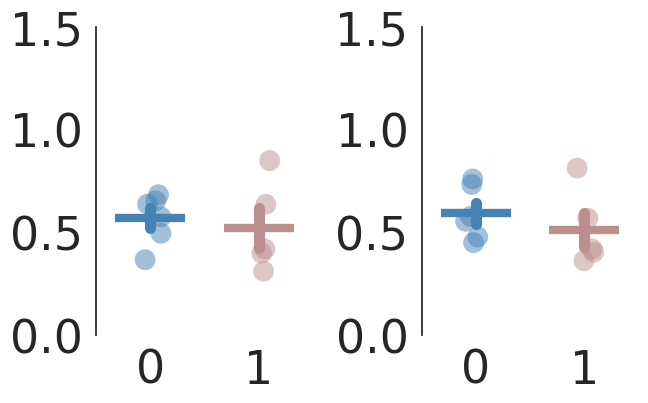

group #, N, MEANS, and SEM
0 2488 0.5698993926818531 0.010226871032861719
normality test is ShapiroResult(statistic=0.8510362505912781, pvalue=1.821688003622262e-43)
1 2291 0.49204567136426597 0.010131232557202628
normality test is ShapiroResult(statistic=0.8052483201026917, pvalue=0.0)
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
dienencephalon
SHOWING PLOTS FOR comparison  obj
group[T.iso]: p-value = 0.303382
SHOWING PLOTS FOR comparison  drf
group[T.iso]: p-value = 0.325879


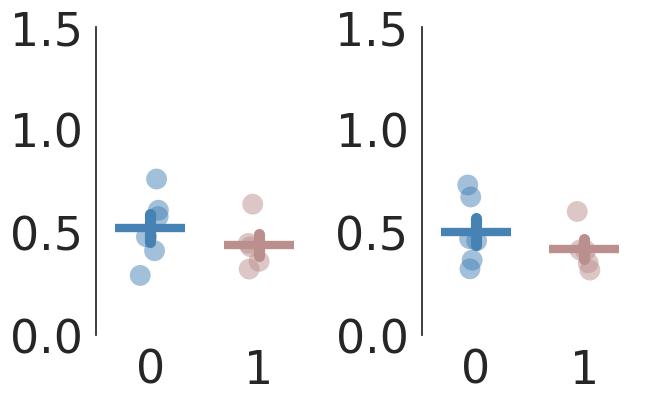

group #, N, MEANS, and SEM
0 601 0.5020241008814068 0.01745891259473225
normality test is ShapiroResult(statistic=0.8716980218887329, pvalue=8.083079295000692e-22)
1 777 0.40304646336385896 0.012237010760447954
normality test is ShapiroResult(statistic=0.8775725364685059, pvalue=3.0871288581375865e-24)
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
mesencephalon
SHOWING PLOTS FOR comparison  obj
group[T.iso]: p-value = 0.008807
SHOWING PLOTS FOR comparison  drf
group[T.iso]: p-value = 0.086229


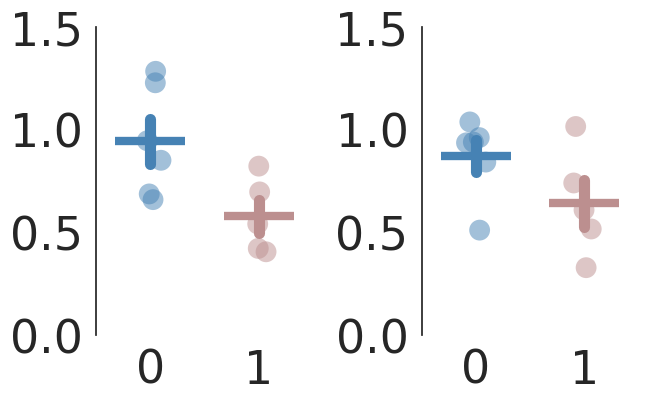

group #, N, MEANS, and SEM
0 2355 0.8829431771721684 0.01774032828890359
normality test is ShapiroResult(statistic=0.831171989440918, pvalue=1.8216880036222622e-44)
1 4893 0.6438110607004107 0.009562636831842476
normality test is ShapiroResult(statistic=0.7832507491111755, pvalue=0.0)
DZ-230529_wk6_f1_-130_schooling
DZ-230529_wk6_f2_-110_schooling
DZ-230526-f1-140_6wk_schooling
DZ-230524_wk6_f1-2_schooling
DZ-230522_wk6_f2-2_schooling
DZ-230521_wk6_f2_schooling
DZ-231025_f1-90_iso6_schooling
DZ-231025_f4-90_iso6_schooling
DZ-231225_f2_iso6_schooling
DZ-231225_f4_iso6_schooling
DZ-231225_f5_iso6_schooling
rhombencephalon
SHOWING PLOTS FOR comparison  obj
group[T.iso]: p-value = 0.829310
SHOWING PLOTS FOR comparison  drf
group[T.iso]: p-value = 0.101044


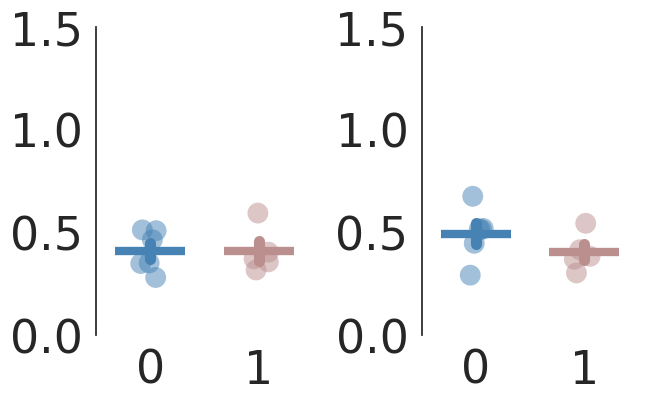

group #, N, MEANS, and SEM
0 281 0.5019458797625129 0.027345389999870802
normality test is ShapiroResult(statistic=0.847762405872345, pvalue=5.945063264751061e-16)
1 1937 0.39762874929675446 0.007995301649437547
normality test is ShapiroResult(statistic=0.8423745036125183, pvalue=3.5305574678817334e-40)


In [ ]:
# Here, plot object selectivity bar graphs across brain regions ()

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects

brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']

brain_region_groupings = [['telencephalon', 'dorsal_forebrain', 'ventral_forebrain'],\
                          ['dienencephalon', 'habenula','thalamus'],\
                          ['mesencephalon', 'left_tectum_neuropil', 'left_tectum_cell-layer','right_tectum_neuropil', 'right_tectum_cell-layer'],\
                          ['rhombencephalon', 'cerebellum', 'hindbrain']]

resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use

for region in brain_region_groupings:

    b_wk6_iso={};  b_wk6={}; #betas
    for i in ['obj','drf','obj_byfish','drf_byfish','f_id','f_grp']:
      b_wk6_iso[i]=[]; b_wk6[i]=[];

    for f in subjects:

      print(f)
      path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

      load = np.load(path+'neuron_details_with-anatomy.npz', allow_pickle=True)
      neuron_locations = load['neuron_anatomy']

      load=np.load(path+'PSTHs.npz', allow_pickle=True)
      responses = load['responses']

      weight_set = responses

      if f in iso6_subjects:
        selectivity_index1 = [abs(a-b) for a,b in zip(weight_set[0], weight_set[1])]
        selectivity_index2 = [abs(a-b) for a,b in zip(weight_set[0], weight_set[3])]
        b_wk6_iso['obj_byfish'].append(np.mean([i for i,loc in zip(selectivity_index1,neuron_locations) if loc in region]))
        b_wk6_iso['drf_byfish'].append(np.mean([i for i,loc in zip(selectivity_index2,neuron_locations) if loc in region]))
        for sel1,sel2,loc in zip(selectivity_index1,selectivity_index2, neuron_locations):
          if loc in region:
            b_wk6_iso['obj'].append(sel1)
            b_wk6_iso['drf'].append(sel2)
            b_wk6_iso['f_id'].append(f)#ndx)
            b_wk6_iso['f_grp'].append('iso')
      if f in wk6_subjects:
        selectivity_index1 = [abs(a-b) for a,b in zip(weight_set[0], weight_set[1])]
        selectivity_index2 = [abs(a-b) for a,b in zip(weight_set[0], weight_set[3])]
        b_wk6['obj_byfish'].append(np.mean([i for i,loc in zip(selectivity_index1,neuron_locations) if loc in region]))
        b_wk6['drf_byfish'].append(np.mean([i for i,loc in zip(selectivity_index2,neuron_locations) if loc in region]))
        for sel1,sel2,loc in zip(selectivity_index1,selectivity_index2, neuron_locations):
          if loc in region:
            b_wk6['obj'].append(sel1)
            b_wk6['drf'].append(sel2)
            b_wk6['f_id'].append(f)#ndx)
            b_wk6['f_grp'].append('ctrl')

    plt.figure(figsize=[7,4])
    plt.tight_layout(pad=10.0)
    plt.ylabel('selectivity_index')
    print(region[0])
    for ndx,(regs,regs_byfish) in enumerate(zip(['obj','drf'],['obj_byfish','drf_byfish'])):

      print("SHOWING PLOTS FOR comparison ", regs)

      #selectivity index
      plt.subplot(1,2,ndx+1)

      summary_data = [b_wk6[regs],b_wk6_iso[regs]]
      summary_data_byfish = [b_wk6[regs_byfish],b_wk6_iso[regs_byfish]]
      summary_fids = [b_wk6['f_id'], b_wk6_iso['f_id']]
      summary_grps = [b_wk6['f_grp'], b_wk6_iso['f_grp']]

      sns.pointplot(data=summary_data_byfish, estimator='mean', errorbar='se', markers='_', markersize=50, linewidth=8, palette=['steelblue', 'rosybrown'], linestyle='none')
      sns.stripplot(data=summary_data_byfish, s=15, palette=['steelblue', 'rosybrown'], jitter=True, alpha=0.5)
      plt.ylim(0,1.5)

      sns.despine(top=True, right=True, bottom=True)

      df = pd.DataFrame({
                  'cell_values': np.concatenate([b_wk6[regs],b_wk6_iso[regs]]),
                  'group': np.concatenate([b_wk6['f_grp'],b_wk6_iso['f_grp']]),
                  'fish_ID': np.concatenate([b_wk6['f_id'],b_wk6_iso['f_id']]),
                  })

      # Convert 'group' to categorical if it's not already
      df['group'] = df['group'].astype('category')

      # Fit the linear mixed-effects model
      model = smf.mixedlm("cell_values ~ group", df, groups=df['fish_ID'])
      result = model.fit()

      # Print the summary of the model
      #print(result.summary())
      p_values = result.pvalues
      # Print p-values with increased precision
      for index,(param, p_value) in enumerate(p_values.items()):
          if index==1:
            print(f"{param}: p-value = {p_value:.6f}")

    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    #plt.savefig(figure_savepath +"selectivity_"+region[0]+".pdf", transparent=True, bbox_inches='tight', pad_inches=0.2)
    plt.show()

    print("group #, N, MEANS, and SEM")
    for ndx,i in enumerate(summary_data):
        print(ndx, len(i), np.mean(i), scipy.stats.sem(i))
        print('normality test is', scipy.stats.shapiro(i))



0 s1
1 s4
2 s1
3 s4


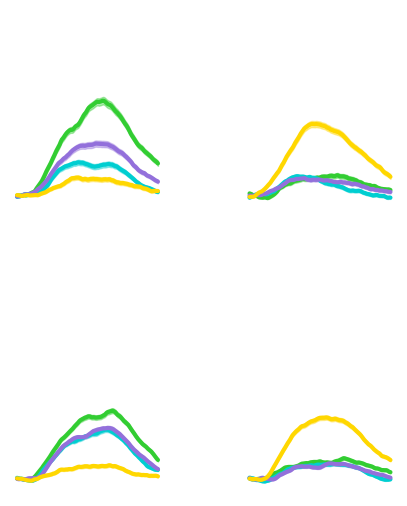

In [ ]:
#plot PSTHs of + and - cells, and their location

thresh = 10 #percentile of beta weight distribution

wk6_subjects=[
'DZ-230529_wk6_f1_-130_schooling',
'DZ-230529_wk6_f2_-110_schooling',
'DZ-230526-f1-140_6wk_schooling',
'DZ-230524_wk6_f1-2_schooling',
'DZ-230522_wk6_f2-2_schooling',
'DZ-230521_wk6_f2_schooling',
]

iso6_subjects=[
'DZ-231025_f1-90_iso6_schooling',
'DZ-231025_f4-90_iso6_schooling',
'DZ-231225_f2_iso6_schooling',
'DZ-231225_f4_iso6_schooling',
'DZ-231225_f5_iso6_schooling',
]

subjects = wk6_subjects+iso6_subjects


brain_regions = ['dorsal_forebrain', 'ventral_forebrain', 'habenula','thalamus',\
                 'left_tectum_neuropil', 'left_tectum_cell-layer',\
                 'right_tectum_neuropil', 'right_tectum_cell-layer',\
                 'cerebellum', 'hindbrain']

brain_region_groupings = [['telencephalon', 'dorsal_forebrain', 'ventral_forebrain'],\
                          ['dienencephalon', 'habenula','thalamus'],\
                          ['mesencephalon', 'left_tectum_neuropil', 'left_tectum_cell-layer','right_tectum_neuropil', 'right_tectum_cell-layer'],\
                          ['rhombencephalon', 'cerebellum', 'hindbrain']]


resample_Hz = 10 #define common Hz to resample all
ts_fraction = [0.05,1.0] #fraction of full timeseries to use


wk6={}; wk6_iso={}; #summary stats for each age group
twk6={}; twk6_iso={}; #traces for plotting
for i in ['s1','s2','s3','s4']: #each stimulus type
      wk6[i]=[]; wk6_iso[i]=[];
      twk6[i]=[]; twk6_iso[i]=[];

for f in subjects:
        path = '/content/drive/MyDrive/Zada_Schulze_paper/Imaging_data/Imaging_Isolated/'+f+'/'

        #load processed imaging data
        load = np.load(path+'neuron_details_with-anatomy.npz', allow_pickle=True)
        coords = load['neuron_coordinates']
        xs=[i[0] for i in coords]
        ys=[i[1] for i in coords]
        tr=load['neuron_traces']
        neuron_locations = load['neuron_anatomy']

        output_ops =np.load(path+"suite2p/plane0/ops.npy", allow_pickle=True).item()

        load=np.load(path+'movement_stats.npz', allow_pickle=True)
        tmp=load['time_sec']
        time=[i-tmp[0] for i in tmp]
        new_time_base = int(max(time)*resample_Hz)
        tail_angle=resized(load['angle'],new_time_base)
        turn_array=resized(load['any_turn_array'],new_time_base)
        stimulus=load['stim']

        load=np.load(path+'linear_model_outputs_ridge.npz', allow_pickle=True)
        pred_scores=load['pred_scores']
        weight_set=load['weight_set']

        s0=np.zeros(len(stimulus));
        s1=np.zeros(len(stimulus));
        s2=np.zeros(len(stimulus));
        s3=np.zeros(len(stimulus));
        s4=np.zeros(len(stimulus));

        for ndx,i in enumerate(stimulus):
          if i==0:
            s0[ndx]=1
          if i==1:
            s1[ndx]=1
          if i==2:
            s2[ndx]=1
          if i==3:
            s3[ndx]=1
          if i==4:
            s4[ndx]=1

        #resample all to common Hz, and crop to first X% of behavior
        S1=resized(s1,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S2=resized(s2,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S3=resized(s3,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        S4=resized(s4,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        MOV=resized(turn_array,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
        tail_angle2 = tail_angle[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]

        #get stimulus onset times
        post_stim_dur=12*resample_Hz   #post-stimulus duration (s)

        S1_ON = [ndx for ndx,i in enumerate(S1) if i>0 and S1[ndx-1]==0 and resample_Hz < ndx < len(S1)-post_stim_dur]
        S2_ON = [ndx for ndx,i in enumerate(S2) if i>0 and S2[ndx-1]==0 and resample_Hz < ndx < len(S2)-post_stim_dur]
        S3_ON = [ndx for ndx,i in enumerate(S3) if i>0 and S3[ndx-1]==0 and resample_Hz < ndx < len(S3)-post_stim_dur]
        S4_ON = [ndx for ndx,i in enumerate(S4) if i>0 and S4[ndx-1]==0 and resample_Hz < ndx < len(S4)-post_stim_dur]
        MOV_ON = [ndx for ndx,i in enumerate(MOV) if i>0 and MOV[ndx-1]==0 and resample_Hz < ndx < len(MOV)-post_stim_dur]

        #handle fluorescence traces here
        neuron_traces=[]
        for i in tr:
            #resize, crop, detrend, and smooth
            tmp = resized(i,new_time_base)[int(new_time_base*ts_fraction[0]):int(new_time_base*ts_fraction[1])]
            kernel_size = int(1.0*resample_Hz) #1.0s
            kernel = np.ones(kernel_size) / kernel_size
            tmp2 = np.convolve(tmp, kernel, mode='smooth') #smooth
            tmp2[:resample_Hz*1]=tmp2[resample_Hz*1] #correcting for edge effects
            tmp2[-resample_Hz*1:]=tmp2[-resample_Hz*1] #correcting for edge effects
            neuron_traces.append(scipy.stats.zscore(tmp2)) #append zscore

        if f in wk6_subjects:
          for ndx,(summary,onsets) in enumerate(zip(['s1','s2','s3','s4'], [S1_ON,S2_ON,S3_ON,S4_ON])):
            for w,tr,loc in zip(weight_set[ndx],neuron_traces,neuron_locations):
                twk6[summary].append(np.mean([tr[i-resample_Hz:i+post_stim_dur]-np.mean(tr[i-resample_Hz:i]) for i in onsets], axis=0))
                if w[0]>np.percentile([w[0] for w in weight_set[ndx]], 100-thresh):
                  wk6[summary].append(1)
                elif w[0]<np.percentile([w[0] for w in weight_set[ndx]], thresh):
                  wk6[summary].append(-1)
                else:
                  wk6[summary].append(0)

        if f in iso6_subjects:
          for ndx,(summary,onsets) in enumerate(zip(['s1','s2','s3','s4'], [S1_ON,S2_ON,S3_ON,S4_ON])):
            for w,tr,loc in zip(weight_set[ndx],neuron_traces,neuron_locations):
                twk6_iso[summary].append(np.mean([tr[i-resample_Hz:i+post_stim_dur]-np.mean(tr[i-resample_Hz:i]) for i in onsets], axis=0))
                if w[0]>np.percentile([w[0] for w in weight_set[ndx]], 100-thresh):
                  wk6_iso[summary].append(1)
                elif w[0]<np.percentile([w[0] for w in weight_set[ndx]], thresh):
                  wk6_iso[summary].append(-1)
                else:
                  wk6_iso[summary].append(0)

plt.figure(figsize=[5,10])
plt.tight_layout(pad=5.0)
count=0
#plt.title("positive-going cells, "+ region[0])

for trace,age in zip([twk6,twk6_iso],[wk6,wk6_iso]):
      for index1 in ['s1','s4']:
          print(count, index1)
          count+=1
          plt.subplot(3,2,count)
          #plt.axvline(resample_Hz, color='0.3', linewidth=2.0, alpha=0.5)

          score = age[index1]

          for index2, c in zip(['s1','s2','s3','s4'], ['limegreen', 'darkturquoise', 'mediumpurple', 'gold']):
            traces = trace[index2]
            tmp=[t for t,i in zip(traces,score) if i==1]
            plt.plot(np.nanmean(tmp, axis = 0), color = c, linewidth=3)
            plt.fill_between(np.arange(np.nanmean(tmp, axis=0).shape[0]),
                  np.nanmean(tmp, axis=0)+scipy.stats.sem(tmp, axis= 0),
                  np.nanmean(tmp, axis=0)-scipy.stats.sem(tmp, axis=0), color=c, alpha=0.4)
          plt.ylim(-0.2,2.2)
          plt.xticks([])
          plt.yticks([])
plt.subplots_adjust(hspace=0.4, wspace=0.5)
sns.despine(bottom=True, left=True)
#plt.savefig(figure_savepath +"responsive-cells_examples_all_summary.pdf", transparent=True, bbox_inches='tight', pad_inches=0.2)
plt.show()

